<a href="https://colab.research.google.com/github/jan-de-trop/Post-hurricane-damage-assessment/blob/main/Encoder_block_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Post Hurricane Damage Assesment Using Convolutional Neural Network 



### Content of this notebook 
1. Initial EDA 
2. SOTA's Comparison 
3. Learning rate finder
4. Visualising InceptionNet with Saliency and GradCam 
5. Autoencoder for reconstruction of Image
6. CNN with Encoder from autoencoder
7. SOTA CNN vs Our model
8. Feature Maps, Saliency Map, Gradcam and PCA
9. GDAL for unlabelled test dataset
10. Speculate on any improvements

### Understanding the Problem from a High Level View
An unmatched 12 storms out of which 6 landed have made landfall in the USAin 2020, with the state of Louisiana seeing 5 of them. Post hurricane disaster large scale damage assesment is vital to relief helpers and first reponders for resource allocation. After the Hurricane events, rapid and reliable information describing the nature of the event and impact on the communities is required. Based on this information the first responders allocate resources for rescue missions. 

### Field Data Collection Approaches after Hurricane events. 
The most commonly used approaches are paper and pen, electornic and recorded video approach.  

1. Pen and paper approach - Uses a pen and paper to collect data to assess damage in the field, using pre made data collection form or by taking notes which are later transferred to a system. This method is not widely used anymore. 
2. Electronic approach - Personal digital assessment or a portable tablet, computer is used to make assessment. 
3. Recorded Video approach - Newest appraoch for aftermath data collection. Vidoes of the affected area are recorded by linking the videos to a global positioning system (GPS), and then integrating the video Geographical information system (GIS). This approach is particularly useful in post disaster enviroment and recovery assesments. 

### Damage Assessment Process. 

Damage assessment is a contineous process that begins after the occurrence of a disaster and contineous into and beyond the post impact period.The process can help us answering various questions such as what kind of structure failed and why. 
The assessment methodology can be applied to other natural disasters as well, and divides the process into 4 simple steps. 

1. Data collection 
2. Data examination 
3. Analysis 
4. Reporting

### Metrics of performance measure 
For initial implementation we want to classify buildings into two categories, damaged and no damage. Our goal is to do the following. 
1. Use 10,000 images of size 128x128 for training our Convolutional neural network to correctly predict if the building has sustained any damages. 
2. Use the 1000 images (per class) of the same image size for validation 
3. For testing purposes we have used 3 datasets. 
    1. We have an unbalanced test data set with 8000/1000 (damage/nodamage) images. 
    2. We have also used another test data set for final accuracy with 1000 images. 
    3. We have used the hurricane delta website to get an unlabled dataset to make classification prediction. 
    
### Approach to solve the problem
As we can clearly see that the manual method of damage assessment is pain-stalkingly slow and the biggest process of collection and analysis of the data is done during a very time sensitive period it is important to have automation in initial damage assessment. The process can be largely automated as the Geospatial data can be quickly collected and analysis and reporting can be done. As it has been cited on the research paper, an attention based system can be designed with high accuracy where we can do damage scale classification. 

### Inherit Assumptions of the problem 

1. A large amount of geospatial data can be easily made available but we are limited by vertical imagery. All structural damage may not be predicted in many cases and it is hard to predict the scale of damage. But the information can be highly effective for first responders.
2. The model is also very reliant on the data generated by human classificaiton of the satalite images and in some cases the damage may not be visible because of vertical imagery. We have assumed that all images have been correctly classified.

In [ ]:
# Import necessary libraries


import tensorflow as tf

#config = tf.compat.v1.ConfigProto()
#config.gpu_options.allow_growth = True
#sess = tf.compat.v1.Session(config=config)


from tensorflow.keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose, Activation, Dense, Dropout, Flatten, BatchNormalization,Reshape
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import  array_to_img, img_to_array, load_img
from tensorflow.keras.optimizers import Adam
from skimage.color import rgb2lab, lab2rgb, rgb2gray

import numpy as np
import os
import random
import matplotlib.pyplot as plt


In [ ]:
train_dir = 'Data\\train_another'
val_dir = 'Data\\validation_another'

In [ ]:
# Get train and validation data


train_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)
val_datagen =  ImageDataGenerator(rescale = 1./255)#, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)


train_gen = train_datagen.flow_from_directory(train_dir, target_size = (128,128), color_mode= 'rgb', shuffle = True)
val_gen = val_datagen.flow_from_directory(val_dir, target_size= (128,128), color_mode= 'rgb', shuffle = True)



Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [ ]:
label_dic = train_gen.class_indices

In [ ]:
print('The 2 classes are:',label_dic)

The 2 classes are: {'damage': 0, 'no_damage': 1}


In [ ]:
new_labeldic = {v:k for k,v in label_dic.items()}

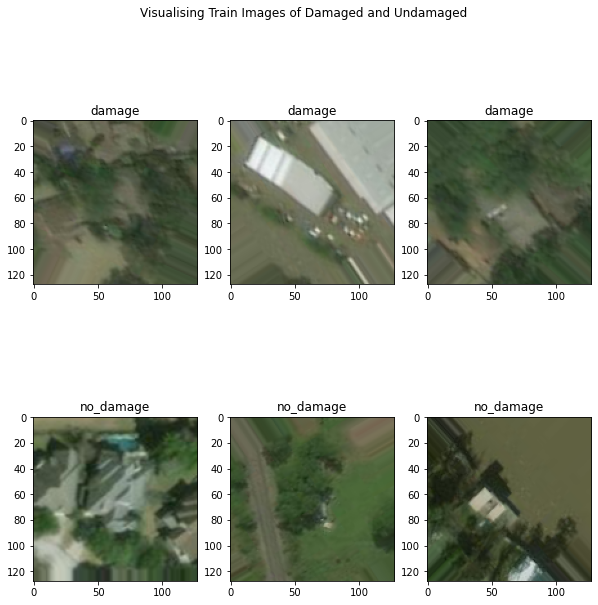

In [ ]:
fig, ax = plt.subplots(2, 3, figsize = (10,10))
plt.suptitle('Visualising Train Images of Damaged and Undamaged')
dam = 0
no_dam = 0
a = train_gen.next()
#print(a[1])
i = 0
while(dam !=3 or no_dam!=3):
    #print('class:', np.argmax(a[1][i]))
    if(dam!= 3 and np.argmax(a[1][i])==0):
        ax[0][dam].imshow(a[0][i])
        ax[0][dam].set_title(new_labeldic[0])
        dam+=1
    elif(no_dam!= 3 and np.argmax(a[1][i])==1):
        ax[1][no_dam].imshow(a[0][i])
        ax[1][no_dam].set_title(new_labeldic[1])
        no_dam+=1
    #print('dam:', dam)
    #print('no_dam:',no_dam)
    i+=1
        

# Initial EDA 
### Inference:
1. Initially we have randomly printed out train dataset images. 
2. Houses and establishments can easily be recognised in no damage dataset.
3. Partial structure damage can easily be recognised in the damage class of the dataset.
4. We can check the Saliency Maps to verify EDA

In [ ]:
# Importing the required libraries
import tensorflow as tf
#config = tf.compat.v1.ConfigProto()
#config.gpu_options.allow_growth = True
#sess = tf.compat.v1.Session(config=config)

from tensorflow.keras.layers import MaxPooling2D, Conv2D, UpSampling2D, InputLayer, Conv2DTranspose, Activation, Dense, Dropout, Flatten, BatchNormalization,Reshape
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import  array_to_img, img_to_array, load_img
import numpy as np
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import tensorflow.keras as keras
from tensorflow.keras.callbacks import Callback
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD 
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D, Dropout, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils import normalize
#import tensorflow_hub as hub
#import cv2

print("TF version:", tf.__version__)
#print("Hub version:", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

TF version: 2.1.0
GPU is available


In [ ]:
#Defining paths for train, test, and validation directories
data_path = 'Data'
train_dir = os.path.join(data_path, 'train_another')
valid_dir = os.path.join(data_path, 'validation_another')
test_dir = os.path.join(data_path, 'test_another')

(128, 128, 3)


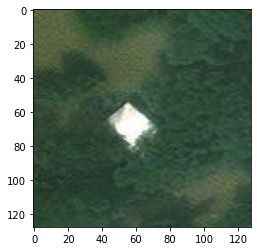

In [ ]:
# Plotting an image to get an idea about the data 
file_names = os.listdir(train_dir + '/damage/')
img = image.load_img(train_dir + '/damage/'+ file_names[0])
print(np.shape(img))
plt.imshow(img)

In [ ]:
#Initializing the ImageDataGEnerator object for train, valid and test data. 
#Train data generator. 
train_datagen = ImageDataGenerator(preprocessing_function = preprocess_input,
                                   rotation_range = 180,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   horizontal_flip = True,
                                   vertical_flip = True,
                                   zoom_range = 0.3)
#Valid data generator 
valid_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)
                        
#Test data generator
test_datagen = ImageDataGenerator(preprocessing_function = preprocess_input)

In [ ]:
#The input to the InceptionV3 architecture needs to be of size 299x299x3, batch size = 32
train_data = train_datagen.flow_from_directory(train_dir, 
                                               target_size = (299,299), 
                                               batch_size =32, 
                                               shuffle = True, 
                                               seed = 1,
                                               color_mode = 'rgb')

valid_data = valid_datagen.flow_from_directory(valid_dir, 
                                               target_size = (299,299),
                                               batch_size =32, 
                                               shuffle = False)

Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


### Architecture: 
The base model is InceptionV3. As the satellite images do not resemble the ImageNet data, the base model is initialized with random weights.

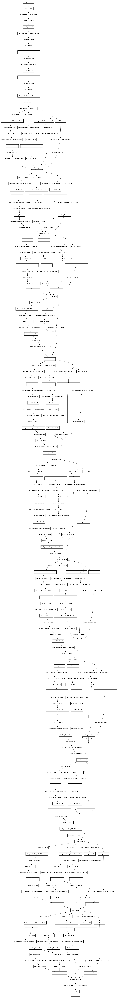

In [ ]:
#Resets all state generated by Keras.
keras.backend.clear_session()

#Base Model 
base_model = InceptionV3(include_top = False, 
                      weights = None,
                      input_shape = (299,299,3),
                      classes = 2)

#Three layers are attached to the output of the Base Model to train and classify the data into damage and no_damage category:
#BaseModelOutput->GlobalAveragePooling->HiddenDenseLayer64neuron->OutputDenseLayer2neurons 
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(64, activation='relu')(x)
output = Dense(2, activation='softmax')(x)
model = Model(inputs = base_model.input, outputs = output)

#Flow chart of your model
tf.keras.utils.plot_model(model)


In [ ]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Architecture", "No. of params", "LR Scheduler","Epochs","Train time (min)","Val acc","Test acc biased", "Test acc unbiased"]
x.add_rows(
    [
        ["VGG", 14747650 ,[0.001,0.0001], [16,14], 55 , 92.3, 90.5,91.6],
        ["ResNet-50", 23718978, [0.001,0.0001], [12,10], 38.5 , 96.1, 95.2, 96.5],
        ["InceptionV3", 21934050, [0.001,0.0001], [19,17], 96 , 98.1, 98.4, 98.6],
    ]
)

print (x)

+--------------+---------------+-----------------+----------+------------------+---------+-----------------+-------------------+
| Architecture | No. of params |   LR Scheduler  |  Epochs  | Train time (min) | Val acc | Test acc biased | Test acc unbiased |
+--------------+---------------+-----------------+----------+------------------+---------+-----------------+-------------------+
|     VGG      |    14747650   | [0.001, 0.0001] | [16, 14] |        55        |   92.3  |       90.5      |        91.6       |
|  ResNet-50   |    23718978   | [0.001, 0.0001] | [12, 10] |       38.5       |   96.1  |       95.2      |        96.5       |
| InceptionV3  |    21934050   | [0.001, 0.0001] | [19, 17] |        96        |   98.1  |       98.4      |        98.6       |
+--------------+---------------+-----------------+----------+------------------+---------+-----------------+-------------------+


### Learning Rate Finder

It is important to find an optimal learning rate(LR) for a neural network to learn effectively and converge to an optimum solution.  

The technique to find an optimal learning rate was first introduced in the 2015 paper “Cyclical Learning Rates for Training Neural Networks”, by Leslie N. Smith. 

The LR finder works on the following concepts: 
* If the LR is low, the training will converge to minimum loss. But weight change will be so small that the training will take a lot of time.
 <img src = '95433.jpg'> 

* If the LR is high, the training may not converge to minimum loss and even diverge in some cases. Weight changes can be so big that the optimizer overshoots the minimum and makes the loss worse.
 <img src = '22474.jpg'> 

* So the optimal LR will be somewhere between low LR and high LR, which gives us the highest loss rate.


Working of learning rate finder: 

* Train network starting from low learning rate and increase the learning rate exponentially after a certain specified number of batches. 
* Record the learning rates and training losses for each of the iterations. 
* Plot the learning rates and training losses. Generally, the graph will look like this: 
<img src = '19507.jpg'>
* From the graph, the optimal learning rate will be the one that has the highest loss rate. So in the above case, it will around 0.01.



In [ ]:
#The code for Learning Rate Finder was take from following github account: 
#https://gist.github.com/WittmannF/c55ed82d27248d18799e2be324a79473

class LRFinder(Callback):

    def __init__(self, min_lr, max_lr, mom=0.9, stop_multiplier=None, 
                 reload_weights=True, batches_lr_update=5):
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.mom = mom
        self.reload_weights = reload_weights
        self.batches_lr_update = batches_lr_update
        if stop_multiplier is None:
            self.stop_multiplier = -20*self.mom/3 + 10 # 4 if mom=0.9
                                                       # 10 if mom=0
        else:
            self.stop_multiplier = stop_multiplier
        
    def on_train_begin(self, logs={}):
        p = self.params
        try:
            n_iterations = p['epochs']*p['samples']//p['batch_size']
        except:
            n_iterations = p['steps']*p['epochs']
            
        self.learning_rates = np.geomspace(self.min_lr, self.max_lr, \
                                           num=n_iterations//self.batches_lr_update+1)
        self.losses=[]
        self.iteration=0
        self.best_loss=0
        if self.reload_weights:
            self.model.save_weights('tmp.hdf5')
        
    
    def on_batch_end(self, batch, logs={}):
        loss = logs.get('loss')
        
        if self.iteration!=0: # Make loss smoother using momentum
            loss = self.losses[-1]*self.mom+loss*(1-self.mom)
        
        if self.iteration==0 or loss < self.best_loss: 
                self.best_loss = loss
                
        if self.iteration%self.batches_lr_update==0: # Evaluate each lr over 5 epochs
            
            if self.reload_weights:
                self.model.load_weights('tmp.hdf5')
          
            lr = self.learning_rates[self.iteration//self.batches_lr_update]            
            K.set_value(self.model.optimizer.lr, lr)

            self.losses.append(loss)            

        if loss > self.best_loss*self.stop_multiplier: # Stop criteria
            self.model.stop_training = True
                
        self.iteration += 1
    
    def on_train_end(self, logs=None):
        if self.reload_weights:
                self.model.load_weights('tmp.hdf5')
                
        plt.figure(figsize=(12, 6))
        plt.plot(self.learning_rates[:len(self.losses)], self.losses)
        plt.xlabel("Learning Rate")
        plt.ylabel("Loss")
        plt.xscale('log')
        plt.show()

### Using the learning rate finder: 

From the graph below, it is clear that the loss rate is maxium when the learning rate between 0.001 to 0.01. 
Traing the network with Learning Rate: 0.001

### Using the Learning rate finder to find the optimum learning rate. 
loss = keras.losses.CategoricalCrossentropy()

optimizer = SGD()

model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

step_size_train=train_data.n//train_data.batch_size

lr_finder = LRFinder(min_lr=1e-5, max_lr=1,batches_lr_update=3)

history = model.fit_generator(train_data, 
                    steps_per_epoch = step_size_train, 
                    epochs = 2,
                    callbacks = [lr_finder])

<img src = 'pranav_lrfind_1.png'>

### Training

#loss = Categorical Crossentropy, Optimizer = Adam, Metrics = Categorical Accuracy

loss = keras.losses.CategoricalCrossentropy()

optimizer = Adam(learning_rate = 0.001)

model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

#Number os train steps and validation steps 

step_size_train=train_data.n//train_data.batch_size

step_size_validation=valid_data.n//valid_data.batch_size

callback = keras.callbacks.EarlyStopping(patience=5)

#Training 

history = model.fit_generator(train_data, 
                    steps_per_epoch = step_size_train, 
                    epochs = 50, 
                    validation_data = valid_data, 
                    validation_steps = step_size_validation,
                    callbacks = [callback])

<img src = 'Training.png'>

### Plotting Loss Vs epoch and Accuracy vs epoch graphs

fig, ax = plt.subplots(1,2,figsize = (16,4))

ax[0].plot(history.history['loss'],color='#EFAEA4',label = 'Training Loss')

ax[0].plot(history.history['val_loss'],color='#B2D7D0',label = 'Validation Loss')

ax[1].plot(history.history['categorical_accuracy'],color='#EFAEA4',label = 'Training Accuracy')

ax[1].plot(history.history['val_categorical_accuracy'],color='#B2D7D0',label = 'Validation Accuracy

ax[0].legend()

ax[1].legend()

ax[0].set_xlabel('Epochs')

ax[1].set_xlabel('Epochs');

ax[0].set_ylabel('Loss')

ax[1].set_ylabel('Binary_accuracy %');

fig.suptitle('Regularized NN', fontsize = 24)

<img src = 'lossPlot.png'>

In [ ]:
#Saving the weights
#model.save_weights('inceptionV3_1.h5')

In [ ]:
#Loading the saved weights
model.load_weights('inceptionV3_1.h5')
loss = keras.losses.CategoricalCrossentropy()
optimizer = Adam(learning_rate = 0.001)
model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

In [ ]:
'''

#Loading the test data (biased data: 8000 damage, 1000 no_damage)
test_data = test_datagen.flow_from_directory(test_dir, 
                                            target_size = (299,299), 
                                            batch_size =32, 
                                            shuffle = False)

#Evaluating the test accuracy 
y_pred = model.evaluate(test_data)

print("Test(biased data) Accuracy:",round(y_pred[1],2))
print("Test(biased data) Loss:", round(y_pred[0],2))
'''


<img src = 'init_test_bias.png'>

### Fine tuning the network. 

Using the Learning rate finder again to find a new learning rate which will fine tune the network. 
From the graph below, it is clear that the loss rate is maxium when the learning rate at 0.0001

loss = keras.losses.CategoricalCrossentropy()

optimizer = SGD()

model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

step_size_train=train_data.n//train_data.batch_size

lr_finder = LRFinder(min_lr=1e-5, max_lr=1,batches_lr_update=5)

history = model.fit_generator(train_data, 
                    steps_per_epoch = step_size_train, 
                    epochs = 2,
                    callbacks = [lr_finder])

<img src = 'pranav_lrfind_2.png'>

#loss = Categorical Crossentropy, Optimizer = Adam, Metrics = Categorical Accuracy

loss = keras.losses.CategoricalCrossentropy()

optimizer = Adam(learning_rate = 0.0001)

model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

#Number os train steps and validation steps 

step_size_train=train_data.n//train_data.batch_size

step_size_validation=valid_data.n//valid_data.batch_size

callback = keras.callbacks.EarlyStopping(patience=5)

#Training

history = model.fit_generator(train_data, 
                    steps_per_epoch = step_size_train, 
                    epochs = 50, 
                    validation_data = valid_data, 
                    validation_steps = step_size_validation,
                    callbacks = [callback])

<img src = 'fine_tuned_traning.png'>

In [ ]:
#Saving the fine tuned weights 
#model.save_weights('inceptionV3_1_fine_tuned.h5')

In [ ]:
#Loading the fine tuned weights. 
model.load_weights('inceptionV3_1_fine_tuned.h5')
model.compile(loss = loss, optimizer=optimizer,  metrics=['categorical_accuracy'])

In [ ]:
'''
#Loading the test data (biased data: 8000 damage, 1000 no_damage)
test_data = test_datagen.flow_from_directory(test_dir, 
                                            target_size = (299,299), 
                                            batch_size =32, 
                                            shuffle = False)

#Evaluating the test accuracy 
y_pred = model.evaluate(test_data)

print("Test(biased data) Accuracy:",round(y_pred[1],2))
print("Test(biased data) Loss:", round(y_pred[0],2))
'''

<img src = 'final_test_bias.png'>

In [ ]:

#Loading the test data (Non-biased data: 1000 damage, 1000 no_damage)

test_dir_nonBiased = os.path.join(data_path, 'test')

test_data_nonBiased = test_datagen.flow_from_directory(test_dir_nonBiased, 
                                            target_size = (299,299), 
                                            batch_size =32, 
                                            shuffle = False)
#Evaluating the test accuracy

#model.evaluate(test_data_nonBiased,verbose = False)

#print("Test(Non-biased data) Accuracy:",round(y_pred[1],2))

#print("Test(Non-biased data) Loss:", round(y_pred[0],2))


Found 2000 images belonging to 2 classes.


<img src = 'final_test_non_bias.png'>

In [ ]:
def get_feature_maps(model, layer_id, input_image):
    
    model_ = Model(inputs=[model.input], outputs=[model.layers[layer_id].output])
    return model_.predict(input_image)[0,:,:,:].transpose((2,0,1))

In [ ]:
# Taking one image from test damage data and one image from test no_damage data. 
file_names = os.listdir(test_dir_nonBiased + '/damage/')
dam_img = image.load_img(test_dir_nonBiased + '/damage/'+ file_names[0], target_size = (299,299))
img_array = image.img_to_array(dam_img)  
img_array_expanded_dims = np.expand_dims(img_array, axis=0) 
dam_img_prePro = preprocess_input(img_array_expanded_dims) 

file_names = os.listdir(test_dir_nonBiased + '/no_damage/')
non_img = image.load_img(test_dir_nonBiased + '/no_damage/'+ file_names[4], target_size = (299,299))
img_array = image.img_to_array(non_img)  
img_array_expanded_dims = np.expand_dims(img_array, axis=0) 
non_img_prePro = preprocess_input(img_array_expanded_dims) 

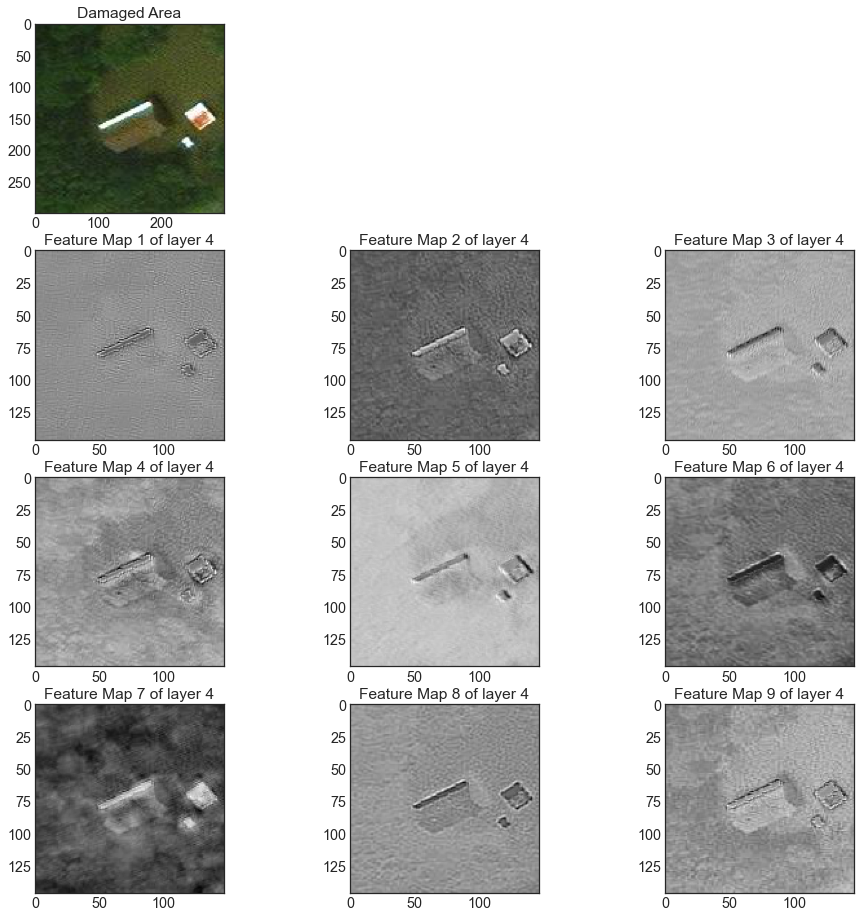

In [ ]:
fig = plt.figure(figsize=(16,16))
col = 3
row = 4

fig.add_subplot(row,col,1)
script = 'Damaged Area'
plt.title(script)
plt.imshow(dam_img)

layer = 4
feature_map = get_feature_maps(model, layer, dam_img_prePro)
for i in range(4, col*row+1):
    feat_img = feature_map[i]
    fig.add_subplot(row, col, i)
    string = 'Feature Map ' + str(i-3) + ' of layer '+str(layer)
    plt.title(string)
    plt.imshow(feat_img, cmap='gray')
    
plt.show() 

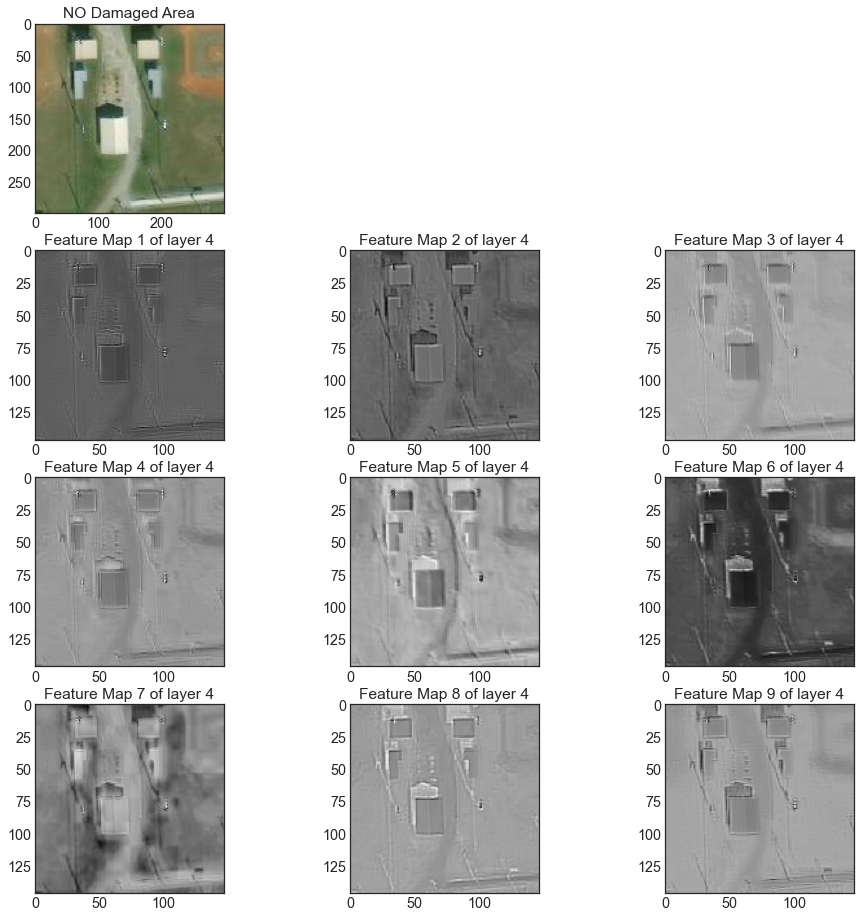

In [ ]:
fig = plt.figure(figsize=(16,16))
col = 3
row = 4

fig.add_subplot(row,col,1)
script = 'NO Damaged Area'
plt.title(script)
plt.imshow(non_img)

layer = 4
feature_map = get_feature_maps(model, layer, non_img_prePro)
for i in range(4, col*row+1):
    feat_img = feature_map[i]
    fig.add_subplot(row, col, i)
    string = 'Feature Map ' + str(i-3) + ' of layer '+str(layer)
    plt.title(string)
    plt.imshow(feat_img, cmap = 'gray')
    
plt.show() 

In [ ]:
lab_dic = {0 : 'damage',1:'no_damage'}

**Model modifier and loss for Saliency and GradCam Map**

In [ ]:
def model_modifier(m):
    m.layers[-1].activation = tf.keras.activations.linear
    return m 

loss = lambda output: tf.keras.backend.mean(output[:, class_idx])

### Visualising Saliency and GradCam Heat Maps

**Plotting the Sliency and GradCam maps for damage class image**

In [ ]:
'''
fig = plt.figure(figsize=(8,8))
col = 2
row = 2


y_pred = model.predict(dam_img_prePro)
class_idx = np.argmax(y_pred)

script = 'True: damage/ Pred: '+lab_dic[class_idx]
fig.add_subplot(row,col,1)
plt.title(script)
plt.imshow(dam_img)

#Salinecy Map
saliency = Saliency(model, model_modifier=model_modifier)
saliency_map = saliency(loss, np.float32(dam_img_prePro), smooth_samples=20, smooth_noise=0.2)
saliency_map = normalize(saliency_map)
fig.add_subplot(row, col, 2)
plt.title('Saliency Map')
j = plt.imshow(saliency_map[0])
plt.colorbar(j)

#GradCam map
gradcam = Gradcam(model, model_modifier=model_modifier)
cam = gradcam(loss, np.float32(dam_img_prePro), penultimate_layer=-1)
cam = normalize(cam)
fig.add_subplot(row, col, 3)
plt.title('Grad-CAM heatmap')
j = plt.imshow(cam[0],cmap='CMRmap')
plt.colorbar(j)
'''

<img src = 'damage_map.png'>

In [ ]:
'''
fig = plt.figure(figsize=(8,8))
col = 2
row = 2

y_pred = model.predict(non_img_prePro)
class_idx = np.argmax(y_pred)
    
fig.add_subplot(row,col,1)
script = 'True: no_damage/ Pred: '+lab_dic[class_idx]
plt.title(script)
plt.imshow(non_img)

#Saliency Map
saliency = Saliency(model, model_modifier=model_modifier)
saliency_map = saliency(loss, np.float32(non_img_prePro), smooth_samples=20, smooth_noise=0.2)
saliency_map = normalize(saliency_map)
fig.add_subplot(row, col, 2)
plt.title('Saliency Map')
j = plt.imshow(saliency_map[0])
plt.colorbar(j)

#GradCam map
gradcam = Gradcam(model, model_modifier=model_modifier)
cam = gradcam(loss, np.float32(non_img_prePro), penultimate_layer=-1)
cam = normalize(cam)
fig.add_subplot(row, col, 3)
plt.title('Grad-CAM heatmap')
j = plt.imshow(cam[0],cmap='CMRmap')
plt.colorbar(j)
'''


<img src = 'non_damage_map.png'>

In [ ]:
# Import necessary libraries


import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)


from tensorflow.keras.layers import Conv2D, UpSampling2D, InputLayer, Conv2DTranspose, Activation, Dense, Dropout, Flatten, BatchNormalization,Reshape
from tensorflow.keras.layers import MaxPooling2D, Input
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import  array_to_img, img_to_array, load_img
from tensorflow.keras.optimizers import Adam
from skimage.color import rgb2lab, lab2rgb, rgb2gray
from sklearn.decomposition import PCA

import numpy as np
import os
import random
import matplotlib.pyplot as plt


### Note: The Training Blocks are Commented to avoid Re-Training, which can be time & resource intensive

#### Advised to not re-run code for this notebook, as then you will have to uncomment and train these blocks again to see all of the Images and their Re-Constructions, and will be interrupted in the sequential execution


## CUSTOM MODEL APPROACH

<img src='Auto_Encoder_Model.jpeg'>

## STEP I: MAKE AUTOENCODER TO RECONSTRUCT TRAINING IMAGES

(Details can be seen in the Summaries & Re-Construnction in below Code Cells)

### Auto-Encoder Model I
Made with (Conv -> Max) * 3 -> Latent Space -> (Upsampling -> Conv) * 3 Units

**Latent Space: 16 x 16 x 32**

Loss Obtained: 0.028
Re-Constructions not clear

### Auto-Encoder Model II

Made with (Conv -> Max) * 2 (Conv) -> Latent Space -> (Conv) -> (Upsampling -> Conv) * 2 Units

**Latent Space: 32 x 32 x 32**

Loss Obtained: 0.013
Re-Constructions very good


In [ ]:
train_dir = 'Data\\train_another'
val_dir = 'Data\\validation_another'


In [ ]:
# Getting the train and validation data


train_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)
val_datagen =  ImageDataGenerator(rescale = 1./255) 


train_gen = train_datagen.flow_from_directory(train_dir, class_mode = 'input', target_size = (128,128), color_mode= 'rgb', shuffle = True)
val_gen = val_datagen.flow_from_directory(val_dir, class_mode = 'input',  target_size= (128,128), color_mode= 'rgb', shuffle = True)

 

Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [ ]:
label_dic = train_gen.class_indices

In [ ]:
print('The 2 classes are:',label_dic)

The 2 classes are: {'damage': 0, 'no_damage': 1}


In [ ]:
# Auto-Encoder Model I

auto = tf.keras.models.Sequential(name = 'Auto-Encoder V1')

In [ ]:
#Encoder

#128 x 128 x 3

auto.add(Conv2D(8, 3, activation = 'relu', padding = 'same', input_shape = (128,128,3) ))

#128 x 128 x 8
auto.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#64 x 64 x 8
auto.add(Conv2D(16, 3, activation = 'relu', padding = 'same'))

#64 x 64 x 16
auto.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#32 x 32 x 16
auto.add(Conv2D(32, 3, activation = 'relu', padding = 'same'))

#32 x 32 x 32
auto.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#16 x 16 x 32

#Decoder
#16 x 16 x 32
auto.add(UpSampling2D(2))

#32 x 32 x 32
auto.add(Conv2D(16, 1, activation = 'relu', padding = 'same'))

#32 x 32 x 16
auto.add(UpSampling2D(2))

#64 x 64 x 16
auto.add(Conv2D(8, 1, activation = 'relu', padding = 'same'))

#64 x 64 x 8
auto.add(UpSampling2D(2))

#128 x 128 x 8
auto.add(Conv2D(3, 1, activation = 'sigmoid', padding = 'same'))

In [ ]:
auto.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 16)        1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 32, 32, 32)        0

In [ ]:
auto.compile(loss = 'mse', optimizer = Adam(lr = 0.003))

### The Training Blocks are Commented to avoid Re-Training, which can be time & resource intensive

#### Advised to not re-run code, as then you will have to uncomment & train these blocks to see the Images & Re-Constructions

The Re-Constructed Images along with Original are displayed in the subsequent code blocks. These indicate that the Model needs more refinement, and maybe is not able to re-construct well from the current dimensions. So the Model is modified thereafter.

**If you run the code again, you need to un-comment the training cells to see the subsequent results and images**

In [ ]:
'''
step_size_train = train_gen.n//train_gen.batch_size
step_size_val = val_gen.n//val_gen.batch_size


auto.fit(train_gen, validation_data = val_gen, epochs = 10, steps_per_epoch = step_size_train, validation_steps = step_size_val)
'''

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 312 steps, validate for 62 steps
Epoch 1/10
312/312 [==============================] - 56s 180ms/step - loss: 0.0072 - val_loss: 0.0032
Epoch 2/10
312/312 [==============================] - 54s 173ms/step - loss: 0.0031 - val_loss: 0.0030
Epoch 3/10
312/312 [==============================] - 53s 171ms/step - loss: 0.0030 - val_loss: 0.0030
Epoch 4/10
312/312 [==============================] - 54s 173ms/step - loss: 0.0028 - val_loss: 0.0029
Epoch 5/10
312/312 [==============================] - 54s 174ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 6/10
312/312 [==============================] - 56s 181ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 7/10
312/312 [==============================] - 56s 179ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 8/10
312/312 [==============================] - 55s 176ms/step - loss: 0.0028 - val_loss: 0.0028
Epoch 9/10
312/312 [==============================] - 55s 175ms/step - loss: 0.0028

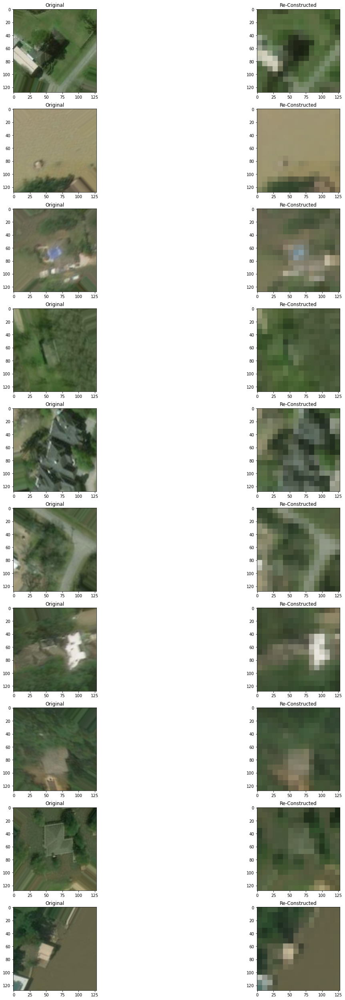

In [ ]:
#Testing how accurately did it Re-Construct
fig, ax = plt.subplots(10, 2, figsize = (20,45))

a = train_gen.next()
a_pred = auto.predict(a)
#print(a_pred[23].shape)
for i in range(10):
    ax[i][0].imshow(a[0][i])
    ax[i][0].set_title('Original')
    
    ax[i][1].imshow(a_pred[i])
    ax[i][1].set_title('Re-Constructed')


In [ ]:
test1_dir = 'Data\\test_another'
test1_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)

test1_gen = test1_datagen.flow_from_directory(test1_dir, class_mode = 'input', target_size = (128,128), color_mode= 'rgb', shuffle = True)

Found 9000 images belonging to 2 classes.


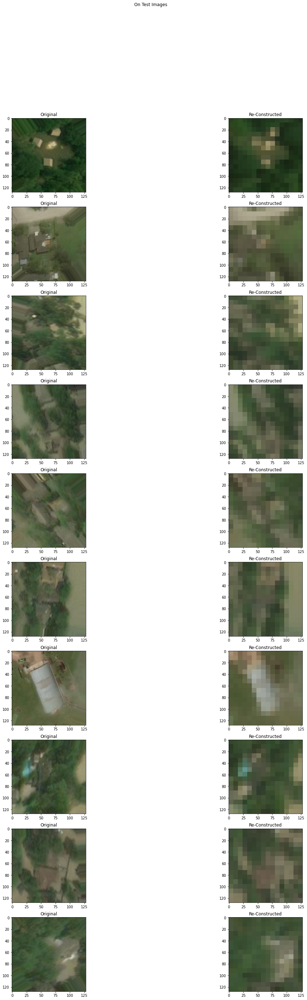

In [ ]:
#Testing how accurately did it Re-Construct
#Check on Test Also

fig, ax = plt.subplots(10, 2, figsize = (20,45))
plt.suptitle('On Test Images')
b = test1_gen.next()
b_pred = auto.predict(b)
#print(a_pred[23].shape)
for i in range(10):
    ax[i][0].imshow(b[0][i])
    ax[i][0].set_title('Original')
    
    ax[i][1].imshow(b_pred[i])
    ax[i][1].set_title('Re-Constructed')


#### Second Model, with removed Max Pooling & Up-Sampling Layers to increase dimensions of Latent Space to 32 x 32 x 32

In [ ]:
# Auto-Encoder

auto2 = tf.keras.models.Sequential(name = 'Auto-Encoder V2')

In [ ]:
#Encoder

#128 x 128 x 3

auto2.add(Conv2D(8, 3, activation = 'relu', padding = 'same', input_shape = (128,128,3) ))

#128 x 128 x 8
auto2.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#64 x 64 x 8
auto2.add(Conv2D(16, 3, activation = 'relu', padding = 'same'))

#64 x 64 x 16
auto2.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#32 x 32 x 16
auto2.add(Conv2D(32, 3, activation = 'relu', padding = 'same'))

#32 x 32 x 32
#auto2.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#16 x 16 x 32

#Decoder
#16 x 16 x 32
#auto2.add(UpSampling2D(2))

#32 x 32 x 32
auto2.add(Conv2D(16, 1, activation = 'relu', padding = 'same'))

#32 x 32 x 16
auto2.add(UpSampling2D(2))

#64 x 64 x 16
auto2.add(Conv2D(8, 1, activation = 'relu', padding = 'same'))

#64 x 64 x 8
auto2.add(UpSampling2D(2))

#128 x 128 x 8
auto2.add(Conv2D(3, 1, activation = 'sigmoid', padding = 'same'))

In [ ]:
auto2.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 128, 128, 8)       224       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 64, 64, 16)        1168      
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 32, 32, 32)        4640      
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 32, 32, 16)        528       
_________________________________________________________________
up_sampling2d_12 (UpSampling (None, 64, 64, 16)       

In [ ]:
auto2.compile(loss = 'mse', optimizer = Adam(lr = 0.003))

**As seen from below, with this new Architecture, we can reduce the loss by half, and get extremely good Re-Constructions**

In [ ]:
'''
step_size_train = train_gen.n//train_gen.batch_size
step_size_val = val_gen.n//val_gen.batch_size


auto2.fit(train_gen, validation_data = val_gen, epochs = 10, steps_per_epoch = step_size_train, validation_steps = step_size_val)
'''

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 312 steps, validate for 62 steps
Epoch 1/10
312/312 [==============================] - 52s 166ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 2/10
312/312 [==============================] - 52s 168ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 3/10
312/312 [==============================] - 52s 167ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 4/10
312/312 [==============================] - 53s 170ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 5/10
312/312 [==============================] - 53s 170ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 6/10
312/312 [==============================] - 52s 165ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 7/10
312/312 [==============================] - 52s 167ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 8/10
312/312 [==============================] - 53s 169ms/step - loss: 0.0013 - val_loss: 0.0013
Epoch 9/10
312/312 [==============================] - 53s 169ms/step - loss: 0.0013

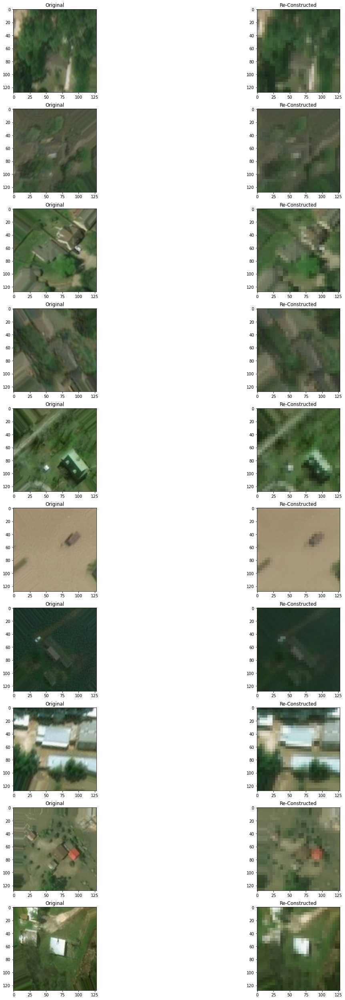

In [ ]:
#Testing how accurately did it Re-Construct
fig, ax = plt.subplots(10, 2, figsize = (20,45))

a = train_gen.next()
a_pred = auto2.predict(a)
#print(a_pred[23].shape)
for i in range(10):
    ax[i][0].imshow(a[0][i])
    ax[i][0].set_title('Original')
    
    ax[i][1].imshow(a_pred[i])
    ax[i][1].set_title('Re-Constructed')


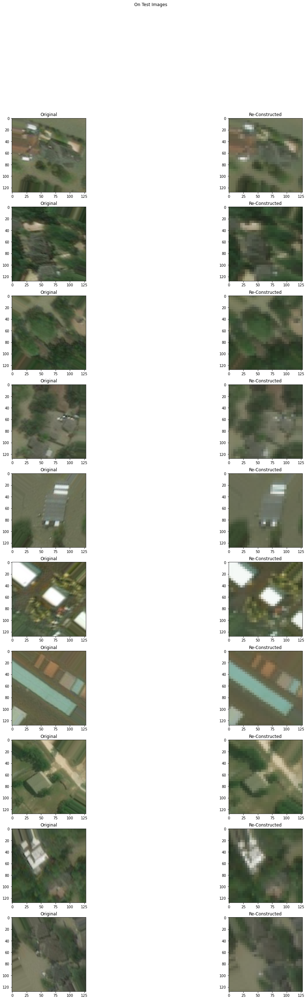

In [ ]:
#Testing how accurately did it Re-Construct
#Check on Test Also

fig, ax = plt.subplots(10, 2, figsize = (20,45))
plt.suptitle('On Test Images')
b = test1_gen.next()
b_pred = auto2.predict(b)
#print(a_pred[23].shape)
for i in range(10):
    ax[i][0].imshow(b[0][i])
    ax[i][0].set_title('Original')
    
    ax[i][1].imshow(b_pred[i])
    ax[i][1].set_title('Re-Constructed')


### Inferences from the Auto-Encoder Made

1. We see that the Auto-Encoder 2, gives a low Re-Construction Error, and is **able to Re-Construct the Images very well.**
2. We can conclude, that the Latent Space has learnt to extract the basic features from the Training Dataset, and **the current weights will be an efficient & optimal starting point for Training for Classification on these Images**

#### Additional Training Inferences Drawn:

1. With Sigmoid: Loss converged to (Both Validation & Train) around 0.0013 (learning rate: 0.001)
2. With Tanh: Loss converged to around 0.0016 -> Images less clear & lesser contrast between colors for this (learning rate: 0.001)
3. With Linear: Loss converged to around 0.0013 (Validation & Train) (learing rate: 0.003)
4. With Sigmoid, having learning rate: 0.003 -> loss again converges to 0.0013 -> clear Re-Constructions

**We conclude that Sigmoid is the activation of our choice, and the learning rate of 0.003 as an initial parameter is favourable**

### Building the Auto-Encoder with Keras API, so can extract Encoder

1. This is done, as we require the Encoder part for Classification
2. As we have figured out the right training inferences, the Auto-Encoder is trained within a few epochs!
3. **We can now save the Encoder Part of the Model to use for Classification, as that has the required weights**

In [ ]:
# Auto-Encoder

auto_encd = tf.keras.models.Sequential(name = 'Encoder')

In [ ]:
#Encoder

#128 x 128 x 3

auto_encd.add(Conv2D(8, 3, activation = 'relu', padding = 'same', input_shape = (128,128,3) ))

#128 x 128 x 8
auto_encd.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#64 x 64 x 8
auto_encd.add(Conv2D(16, 3, activation = 'relu', padding = 'same'))

#64 x 64 x 16
auto_encd.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#32 x 32 x 16
auto_encd.add(Conv2D(32, 3, activation = 'relu', padding = 'same'))

auto_encd.summary()
#32 x 32 x 32 -> Final Output Shape


#auto.add(MaxPooling2D(pool_size = (2,2), strides = 2))

#16 x 16 x 32

#Decoder
#16 x 16 x 32
#auto.add(UpSampling2D(2))



Model: "Encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 16)        1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        4640      
Total params: 6,032
Trainable params: 6,032
Non-trainable params: 0
_________________________________________________________________


In [ ]:
auto_decd = tf.keras.models.Sequential(name = 'Decoder')
#32 x 32 x 32
auto_decd.add(Conv2D(16, 1, activation = 'relu', padding = 'same', input_shape = (32,32,32) ))

#32 x 32 x 16
auto_decd.add(UpSampling2D(2))

#64 x 64 x 16
auto_decd.add(Conv2D(8, 1, activation = 'relu', padding = 'same'))

#64 x 64 x 8
auto_decd.add(UpSampling2D(2))

#128 x 128 x 8
auto_decd.add(Conv2D(3, 1, activation = 'sigmoid', padding = 'same'))

In [ ]:
auto_decd.summary()

Model: "Decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 32, 32, 16)        528       
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 64, 64, 16)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 64, 64, 8)         136       
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 128, 128, 8)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 128, 128, 3)       27        
Total params: 691
Trainable params: 691
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#Building the Auto-Encoder with Keras API

input_img = Input(shape = (128,128,3))

encoded_mdl = auto_encd(inputs = input_img)

decoded_mdl = auto_decd(inputs = encoded_mdl)

#Auto-Encoder
autoencoder = Model(inputs = input_img, outputs = decoded_mdl, name = 'AutoEncoder')

autoencoder.summary()

Model: "AutoEncoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
Encoder (Sequential)         (None, 32, 32, 32)        6032      
_________________________________________________________________
Decoder (Sequential)         (None, 128, 128, 3)       691       
Total params: 6,723
Trainable params: 6,723
Non-trainable params: 0
_________________________________________________________________


In [ ]:
autoencoder.compile(loss = 'mse', optimizer = Adam(lr = 0.003))

In [ ]:
step_size_train = train_gen.n//train_gen.batch_size
step_size_val = val_gen.n//val_gen.batch_size


autoencoder.fit(train_gen, validation_data = val_gen, epochs = 7, steps_per_epoch = step_size_train, validation_steps = step_size_val)

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 312 steps, validate for 62 steps
Epoch 1/3
312/312 [==============================] - 50s 162ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 2/3
312/312 [==============================] - 53s 169ms/step - loss: 0.0013 - val_loss: 0.0014
Epoch 3/3
312/312 [==============================] - 51s 164ms/step - loss: 0.0013 - val_loss: 0.0013


In [ ]:
#Saving the Encoder Model for Future Use & Classification
#auto_encd.save('EncoderModel1.h5')

## STEP II: Building Classifier with Pre-Trained Encoder using Keras API

**Flow of Training the Model**

1. Load the Pre-Trained Encoder Model
2. Attach Dense Layers to the Model for Classification
3. Train this Model and check for Over-Fitting
4. Attach Dropout with Keras API and train
5. With help of Learning Rate Scheduler, boost training and achieve a low loss

In [ ]:
# Now using the Encoder Model for Classification
Train_Encoder = tf.keras.models.load_model('EncoderModel1.h5')

In [ ]:
Train_Encoder.summary()

Model: "Encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 16)        1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        4640      
Total params: 6,032
Trainable params: 6,032
Non-trainable params: 0
_________________________________________________________________


In [ ]:
input_imgenc = Input(shape = (128,128,3))
x = Train_Encoder(inputs = input_imgenc)
x = Flatten(input_shape = (32,32,32))(x)
x = Dense(128, activation = 'relu')(x)
x = Dense(64, activation = 'relu')(x)
x = Dense(32, activation = 'relu')(x)
x = Dense(2, activation = 'sigmoid')(x)


In [ ]:
auto_class = Model(inputs = input_imgenc, outputs = x, name = 'Auto_Class')
auto_class.summary()

Model: "Auto_Class"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
Encoder (Sequential)         (None, 32, 32, 32)        6032      
_________________________________________________________________
flatten (Flatten)            (None, 32768)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               4194432   
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 6

In [ ]:
auto_class.compile(loss = 'binary_crossentropy', optimizer = Adam(lr = 0.003), metrics = ['accuracy'])

In [ ]:
# Getting train and validation data for Classification


train_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)
val_datagen =  ImageDataGenerator(rescale = 1./255)
train_gen = train_datagen.flow_from_directory(train_dir, target_size = (128,128), color_mode= 'rgb', shuffle = True)
val_gen = val_datagen.flow_from_directory(val_dir, target_size= (128,128), color_mode= 'rgb', shuffle = True)



Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [ ]:
'''
#Uncomment to Train -> Can take 20 - 30 epochs (about 15-20 mins on GPU)

step_size_train = train_gen.n//train_gen.batch_size
step_size_val = val_gen.n//val_gen.batch_size
callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',patience = 5, restore_best_weights = True)

history = auto_class.fit(train_gen, validation_data = val_gen, epochs = 50, steps_per_epoch = step_size_train, validation_steps = step_size_val, callbacks = [callback])
'''


  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 312 steps, validate for 62 steps
Epoch 1/50
312/312 [==============================] - 47s 149ms/step - loss: 0.6620 - accuracy: 0.7139 - val_loss: 0.6881 - val_accuracy: 0.6202
Epoch 2/50
312/312 [==============================] - 45s 146ms/step - loss: 0.4112 - accuracy: 0.8286 - val_loss: 0.4809 - val_accuracy: 0.7616
Epoch 3/50
312/312 [==============================] - 43s 138ms/step - loss: 0.3328 - accuracy: 0.8622 - val_loss: 0.2897 - val_accuracy: 0.8899
Epoch 4/50
312/312 [==============================] - 43s 138ms/step - loss: 0.2986 - accuracy: 0.8805 - val_loss: 0.5903 - val_accuracy: 0.6973
Epoch 5/50
312/312 [==============================] - 43s 137ms/step - loss: 0.2776 - accuracy: 0.8886 - val_loss: 0.3126 - val_accuracy: 0.8901
Epoch 6/50
312/312 [==============================] - 43s 138ms/step - loss: 0.2539 - accuracy: 0.8977 - val_loss: 0.2564 - val_accuracy: 0.8952
Epoch 7/50
312/312 [=================

In [ ]:
test1_dir = 'Data\\test_another'
tst_datagen = ImageDataGenerator(rescale = 1./255)
tst_gen = tst_datagen.flow_from_directory(test1_dir, target_size = (128,128), color_mode = 'rgb', shuffle = False)
tst_step = tst_gen.n//tst_gen.batch_size

Found 9000 images belonging to 2 classes.


In [ ]:
tst_loss, tst_accur = auto_class.evaluate_generator(tst_gen, tst_step, verbose = 1)

Instructions for updating:
Please use Model.evaluate, which supports generators.
  ...
    to  
  ['...']
281/281 [==============================] - 8s 28ms/step - loss: 0.1381 - accuracy: 0.9432


In [ ]:
print('Test Loss is:', tst_loss)
print('Test Accuracy is:', round((tst_accur*100),3))

Test Loss is: 0.1381296303671755
Test Accuracy is: 94.323


In [ ]:
test2_dir = 'Data\\test'

tst2_datagen = ImageDataGenerator(rescale = 1./255)
tst2_gen = tst2_datagen.flow_from_directory(test2_dir, target_size = (128,128), color_mode = 'rgb', shuffle = False)
tst2_step = tst2_gen.n//tst2_gen.batch_size

Found 2000 images belonging to 2 classes.


In [ ]:
tst2_loss, tst2_accur = auto_class.evaluate_generator(tst2_gen, tst2_step, verbose = 1)

  ...
    to  
  ['...']
62/62 [==============================] - 2s 28ms/step - loss: 0.1724 - accuracy: 0.9282


In [ ]:
print('Test Loss is:', tst2_loss)
print('Test Accuracy is:', round((tst2_accur*100),3))

Test Loss is: 0.17241613833128563
Test Accuracy is: 92.818


### Basic Model Inferences

1. Model performs decently well with a few epochs of training (20-30 epochs)
2. With just 4 Million Parameters, and about 45 seconds per epoch (normal GPU), the accuracy for the test sets has reached around 92-94%
3. This shows the power of the Transfer Learning from the Weights of the Auto-Encoder we trained

**Auto-Encoder Training: 7-10 Epochs(8mins) + Classifier Training: 20-30 Epochs (20 - 25mins) Accuracy is close to Training an Inception Net without Scheduled Learning Rate**

But the Model can be improved with the following techniques:

1. Regularisation & Generalisation for better Validation in form of Dropout Layers
2. Use of Scheduled Learning Rate to help jump out of local minimas or saddle points

In [ ]:
#Save the Model so can improve from that point of training, and not to re-train it
#auto_class.save('Model_AutoEncoder1.h5')

In [ ]:
# Auto-Encoder Model Improvement

new_auto = tf.keras.models.load_model('Model_AutoEncoder1.h5')

In [ ]:
new_auto.summary()

Model: "Auto_Class"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
Encoder (Sequential)         (None, 32, 32, 32)        6032      
_________________________________________________________________
flatten_5 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               4194432   
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_18 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_19 (Dense)             (None, 2)                 6

### Use of Keras API to add Dropout to a Trained Classifier, so to avoid re-training the initial epochs again

**We used the Keras API extensively, to optimise the training time and resources, by saving the model at checkpoints, loading it and applying modifications to architecture or re-training. This is why the total training time for this model is less than an hour, and it reaches an accuracy close the the SOTAs which needed to be trained for 1-2 Hrs, with high training times like 3 mins per epoch**

In [ ]:
fc1 = new_auto.layers[-4]
fc2 = new_auto.layers[-3]
fc3 = new_auto.layers[-2]
preds = new_auto.layers[-1]

dp1 = Dropout(0.1) #Adding Dropout
dp2 = Dropout(0.1) #Adding Dropout

#Reconnecting
x = dp1(fc1.output)
x = fc2(x)
x = dp2(x)
x = fc3(x)
predictors = preds(x)


Mod_aut_new = Model(inputs = new_auto.input, outputs = predictors)

In [ ]:
Mod_aut_new.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
Encoder (Sequential)         (None, 32, 32, 32)        6032      
_________________________________________________________________
flatten_5 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               4194432   
_________________________________________________________________
dropout (Dropout)            (None, 128)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0     

In [ ]:
Mod_aut_new.compile(loss = 'binary_crossentropy', optimizer = Adam(lr = 0.001), metrics = ['accuracy'])

In [ ]:
'''
step_size_train = train_gen.n//train_gen.batch_size
step_size_val = val_gen.n//val_gen.batch_size
callback = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss',patience = 5, restore_best_weights = True)

history = Mod_aut_new.fit(train_gen, validation_data = val_gen, epochs = 50, steps_per_epoch = step_size_train, validation_steps = step_size_val, callbacks = [callback])

'''

### Final Training of Classifier

Since the overall training can't be reproduced here, as it was done in stages, with Learning Rate re-initialised with a new one, to follow Learning Rate Scheduling, we are attaching a screenshot when we were in middle of the training.

If you do wish to re-train the model, to produce the results we got, perform the following steps:

1. Train with the above configuration, with starting learning rate of 0.003
2. Once training stops with Patience, re-compile the model with learning rate found by LR finder or try 0.001
3. Keep saving weights in between, as to continue training from where you left
4. Each time learning stops, the best weights get restored
5. If you end up with a lower loss than previous training, either re-compile and train again, it helps to find minima, or restart training from last saved best weights

**This process has proven to be highly efficient & successful. We stopped our training with 97% accuracies, however with this process, we can easily reach 98 or 99% too. However, our intention was to prove that this Model approach was correct, and we weren't chasing numbers :D**

<img src = 'Final_Training_AEModel_SS.jpg'>

In [ ]:
#Save the Model for Visualisations and Result analysis

#Mod_aut_new.save('Model_AutoEncoder6.h5')

In [ ]:
train_dir = 'Data\\train_another'
val_dir = 'Data\\validation_another'


In [ ]:
label_dic = train_gen.class_indices

In [ ]:
print('The 2 classes are:',label_dic)

The 2 classes are: {'damage': 0, 'no_damage': 1}


In [ ]:
# Now using the Encoder Model for Classification
Final_Encoder = tf.keras.models.load_model('Model_AutoEncoder6.h5')

In [ ]:
Final_Encoder.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
Encoder (Sequential)         (None, 32, 32, 32)        6032      
_________________________________________________________________
flatten_5 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_16 (Dense)             (None, 128)               4194432   
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0   

## Predicting & Visualising  with the Final Model

Now that we have the final model trained and ready, time to see how well it can perform on the test data and some unseen data from a recent Hurricane Detla! The tasks in this section are as below:-

1. Loss & Accuracy on both Biased & Unbiased Test Sets 
2. We see how the Feature Maps from the Convolution Layers look like
3. We went a step ahead and tried to see if we can see the 2 classes being seperated. But since we can't visualise 32 x 32 x 32 dimensions (32768), we use PCA, to transform these into 2, and see if the model is robust enough to tell with them
4. We also Performance Metrics for the Test Data
5. A ROC Curve is a must where Classification is concerned

**Last but not the least, we took the extra steps to extract a 2 GB TIF file from the net, for the Post-Hurricane Satellite Image of a recent Hurricane Delta. Using the Gdal Library, we extracted images from that, and selected the ones with buildings, so we can classify with our Encoder Model, if the buildings are damaged or not! Stay Tuned :D**

### Flow Chart Look at the Final Model


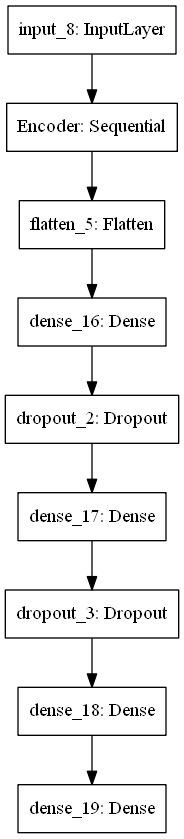

In [ ]:
#Flow chart of Model
tf.keras.utils.plot_model(Final_Encoder)

### Flow Chart for the Encoder used in the Model

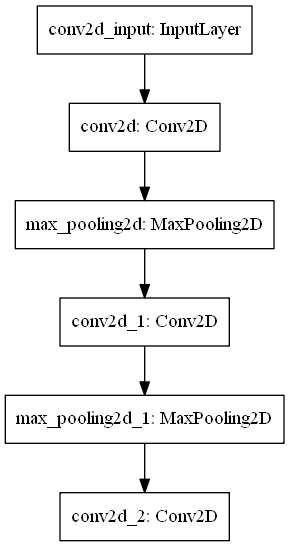

In [ ]:
#Flow chart for Encoder
tf.keras.utils.plot_model(Final_Encoder.layers[1])

In [ ]:
# Get train and validation data for Classification


train_datagen = ImageDataGenerator(rescale = 1./255, rotation_range= 90, width_shift_range= 0.1, height_shift_range= 0.1, zoom_range= 0.1, horizontal_flip = True, vertical_flip = True)
val_datagen =  ImageDataGenerator(rescale = 1./255)
train_gen = train_datagen.flow_from_directory(train_dir, target_size = (128,128), color_mode= 'rgb', shuffle = True)
val_gen = val_datagen.flow_from_directory(val_dir, target_size= (128,128), color_mode= 'rgb', shuffle = True)


Found 10000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [ ]:
test1_dir = 'Data\\test_another'
tst_datagen = ImageDataGenerator(rescale = 1./255)
tst_gen = tst_datagen.flow_from_directory(test1_dir, target_size = (128,128), color_mode = 'rgb', shuffle = False)
tst_step = tst_gen.n//tst_gen.batch_size

Found 9000 images belonging to 2 classes.


**Loss and Accuracy for Biased Test Set with 8000 Damaged & 1000 Un-Damaged** 

In [ ]:
tst_loss, tst_accur = Final_Encoder.evaluate_generator(tst_gen, tst_step, verbose = 1)

  ...
    to  
  ['...']
281/281 [==============================] - 8s 28ms/step - loss: 0.0923 - accuracy: 0.9726


In [ ]:
print('Test Loss is:', tst_loss)
print('Test Accuracy is:', round((tst_accur*100),3), '%')

Test Loss is: 0.09225464585979612
Test Accuracy is: 97.264 %


In [ ]:
test2_dir = 'Data\\test'

tst2_datagen = ImageDataGenerator(rescale = 1./255)
tst2_gen = tst2_datagen.flow_from_directory(test2_dir, target_size = (128,128), color_mode = 'rgb', shuffle = False)
tst2_step = tst2_gen.n//tst2_gen.batch_size

Found 2000 images belonging to 2 classes.


**Loss and Accuracy for Unbiased Test Set with 1000 Damaged & 1000 Un-Damaged** 

In [ ]:
tst2_loss, tst2_accur = Final_Encoder.evaluate_generator(tst2_gen, tst2_step, verbose = 1)

  ...
    to  
  ['...']
62/62 [==============================] - 2s 30ms/step - loss: 0.0884 - accuracy: 0.9637


In [ ]:
print('Test Loss is:', tst2_loss)
print('Test Accuracy is:', round((tst2_accur*100),3), '%')

Test Loss is: 0.08840587958993931
Test Accuracy is: 96.371 %


### Inferences from Loss & Accuracy

1. We see that we get a higher accuracy on the Biased Data-Set. This can be because of 2 possible reasons: The **sheer amount of data points is almost 4-5 times than that of the second test set. So the model tends to get more right, with more samples.** Second could be that the model is better at classifying damaged than not damaged. However, **as we'll see further, the F1 scores prove otherwise, and the model has a high recall & precision.**


2. It is worth noting that the **model gives a lower loss with the second dataset, than with the first, despite having a lower accuracy.** This also supports the point that the high accuracy could be due to the sheer amount of data

### Feature Maps / Activations of Convolution Layers

**This required immense knowledge of the Keras API, as opposed to a normal model, here the layers are in a model within a model. So we had to construct sub-models till each layer for which we wanted the activations, using the Keras API**

In [ ]:
#Printing the Feature Maps
# Had to play a lot with the Keras API

#Test Feature Maps 1
inter_1 = Model(inputs = Final_Encoder.layers[1].inputs, outputs = Final_Encoder.layers[1].layers[0].output)
inter_2 = Model(inputs = Final_Encoder.layers[1].inputs, outputs = Final_Encoder.layers[1].layers[2].output)
inter_3 = Model(inputs = Final_Encoder.layers[1].inputs, outputs = Final_Encoder.layers[1].layers[4].output)



In [ ]:
Final_Encoder.layers[1].summary()

Model: "Encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 8)       224       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 16)        1168      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        4640      
Total params: 6,032
Trainable params: 6,032
Non-trainable params: 0
_________________________________________________________________


In [ ]:
x = Final_Encoder.layers[0]
x = inter_1(x.output)

FM_1 = Model(inputs = Final_Encoder.inputs, outputs = x)

In [ ]:
y = Final_Encoder.layers[0]
y = inter_2(y.output)

FM_2 = Model(inputs = Final_Encoder.inputs, outputs = y)

In [ ]:
z = Final_Encoder.layers[0]
z = inter_3(z.output)

FM_3 = Model(inputs = Final_Encoder.inputs, outputs = z)

**As seen in the summaries, to get each Conv2D layer's activation, we had to create a sub-model till that layer, with Keras API** 

In [ ]:
FM_1.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
model_1 (Model)              (None, 128, 128, 8)       224       
Total params: 224
Trainable params: 224
Non-trainable params: 0
_________________________________________________________________


In [ ]:
FM_2.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
model_2 (Model)              (None, 64, 64, 16)        1392      
Total params: 1,392
Trainable params: 1,392
Non-trainable params: 0
_________________________________________________________________


In [ ]:
FM_3.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
model_3 (Model)              (None, 32, 32, 32)        6032      
Total params: 6,032
Trainable params: 6,032
Non-trainable params: 0
_________________________________________________________________


In [ ]:
a_tst = tst_gen.next()
F_maps1 = FM_1.predict(a_tst)
F_maps2 = FM_2.predict(a_tst)
F_maps3 = FM_3.predict(a_tst)

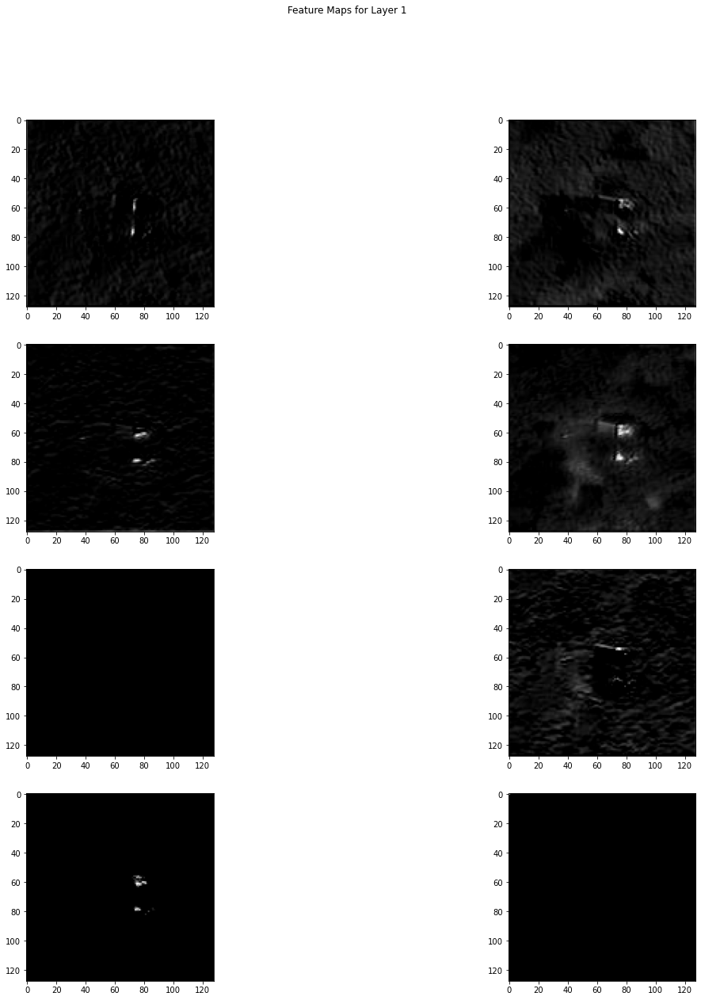

In [ ]:
fig, ax = plt.subplots(4, 2, figsize = (20,20))
plt.suptitle('Feature Maps for Layer 1')

for i in range(8):
    if(i%2==0):
        j = 0
    else:
        j = 1
        
    ax[i//2][j].imshow(F_maps1[0, :, :, i], cmap = 'gray')



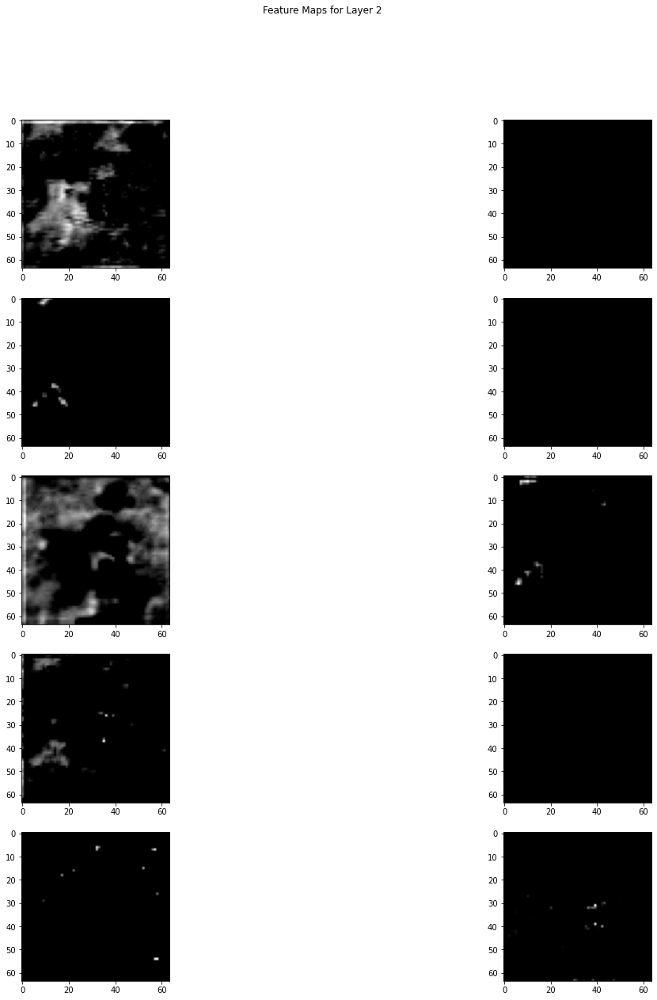

In [ ]:
fig, ax = plt.subplots(5, 2, figsize = (20,20))
plt.suptitle('Feature Maps for Layer 2')

for i in range(10):
    if(i%2==0):
        j = 0
    else:
        j = 1
        
    ax[i//2][j].imshow(F_maps2[0, :, :, i], cmap = 'gray')



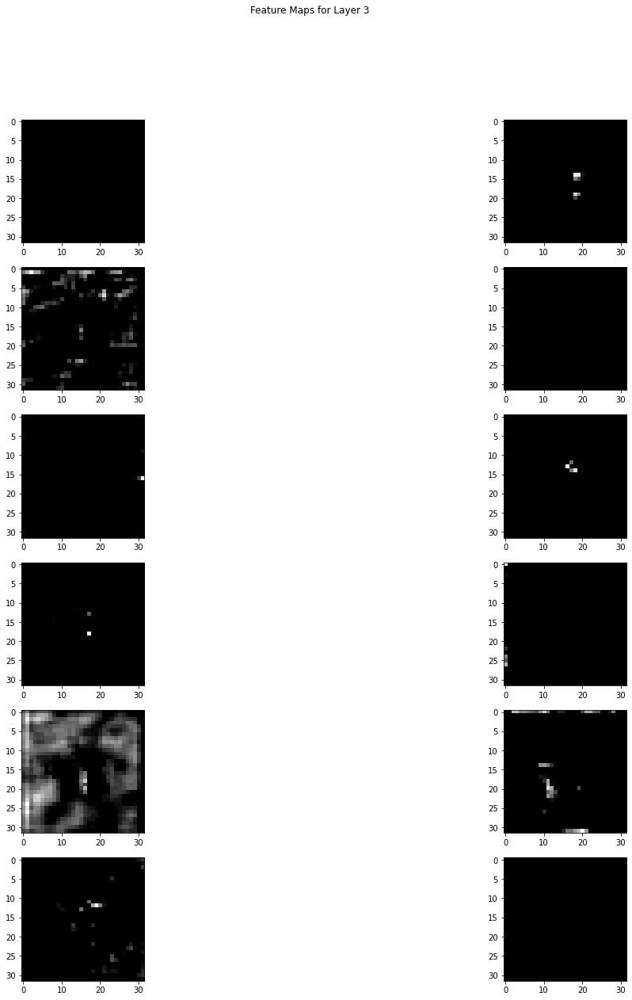

In [ ]:
fig, ax = plt.subplots(6, 2, figsize = (20,20))
plt.suptitle('Feature Maps for Layer 3')

for i in range(12):
    if(i%2==0):
        j = 0
    else:
        j = 1
        
    ax[i//2][j].imshow(F_maps3[0, :, :, i], cmap = 'gray')



### **The Feature Maps from each layer follow the expected trend. The first layer shows how the activations are getting bigger parts of the image, and this reduces in the subsequent feature maps**

## Visualising the Latent Space

Since the Latent Space is of 32 x 32 x 32 = 32768 dimensions, to visualise how the classes are being seperated, we use PCA to transform these dimensions into 2. PCA tries to eliminate dimensions by combining correlated dimensions, and tries to filter out redundant dimensions. 

In [ ]:
act_pred = FM_3.predict(tst_gen)

In [ ]:
act_pred = act_pred.reshape(-1,(32*32*32))

In [ ]:
act_pred.shape

(9000, 32768)

**We see that there are 32768 dimensions, so we use PCA and transform these into 2**

In [ ]:
pca = PCA(n_components=2)

In [ ]:
pcomp = pca.fit_transform(act_pred)

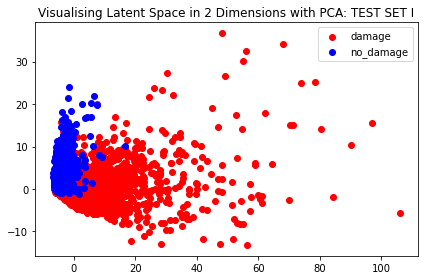

In [ ]:
plt.scatter(pcomp[:8000,0], pcomp[:8000,1], color = 'red', label = 'damage')
plt.scatter(pcomp[8000:,0], pcomp[8000:,1], color = 'blue', label = 'no_damage')
plt.legend()
plt.title('Visualising Latent Space in 2 Dimensions with PCA: TEST SET I')
plt.tight_layout()

In [ ]:
act_pred2 = FM_3.predict(tst2_gen)

In [ ]:
act_pred2 = act_pred2.reshape(-1, (32*32*32))

In [ ]:
act_pred2.shape

(2000, 32768)

In [ ]:
pca2 = PCA(n_components = 2)

In [ ]:
pcomp2 = pca2.fit_transform(act_pred2)

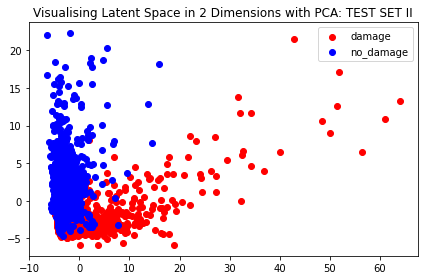

In [ ]:
plt.scatter(pcomp2[:1000,0], pcomp2[:1000,1], color = 'red', label = 'damage')
plt.scatter(pcomp2[1000:,0], pcomp2[1000:,1], color = 'blue', label = 'no_damage')
plt.legend()
plt.title('Visualising Latent Space in 2 Dimensions with PCA: TEST SET II')
plt.tight_layout()

### Inferences from Visualising the Latent Space:

1. We see that **even after transforming 32768 dimensions into 2, we can see the 2 classes being seperated well**
2. This shows that our Model is robust, and has indeed learnt to classify the Images well
3. We can see a **rough indication of why the Test Set I accuracy is higher than Test Set II, despite a similar trend in separation. This is because the number of Damaged Classes are more, which results in a higher accuracy. However, the model is able to segregate both classes well.**
4. From these plots, **we can also identify outliers,** and if needed, can eliminate extreme outliers

## Performance Metrics : Confusion Matrix, Sensitivity, Specificity, Precision & F1 Score

In [ ]:
#FPs, TPs, FNs, TNs
#Test Set I

tst1_preds = Final_Encoder.predict(tst_gen)
tst2_preds = Final_Encoder.predict(tst2_gen)

In [ ]:
tst1_preds = np.argmax(tst1_preds, axis = 1)
tst2_preds = np.argmax(tst2_preds, axis = 1)

In [ ]:
TP_tst1 = sum(tst1_preds[:8000]==0)
FP_tst1 = sum(tst1_preds[8000:]==0)
TN_tst1 = sum(tst1_preds[8000:]==1)
FN_tst1 = sum(tst1_preds[:8000]==1)

In [ ]:
print('Number of True Positives:', TP_tst1)
print('Number of False Positives:', FP_tst1)
print('Number of True Negatives:', TN_tst1)
print('Number of False Negatives:', FN_tst1)

Number of True Positives: 7807
Number of False Positives: 55
Number of True Negatives: 945
Number of False Negatives: 193


In [ ]:
cm1 = [[TN_tst1, FP_tst1],[FN_tst1, TP_tst1]]


In [ ]:
TP_tst2 = sum(tst2_preds[:1000]==0)
FP_tst2 = sum(tst2_preds[1000:]==0)
TN_tst2 = sum(tst2_preds[1000:]==1)
FN_tst2 = sum(tst2_preds[:1000]==1)

In [ ]:
print('Number of True Positives:', TP_tst2)
print('Number of False Positives:', FP_tst2)
print('Number of True Negatives:', TN_tst2)
print('Number of False Negatives:', FN_tst2)

Number of True Positives: 972
Number of False Positives: 50
Number of True Negatives: 950
Number of False Negatives: 28


In [ ]:
cm2 = [[TN_tst2, FP_tst2],[FN_tst2, TP_tst2]]


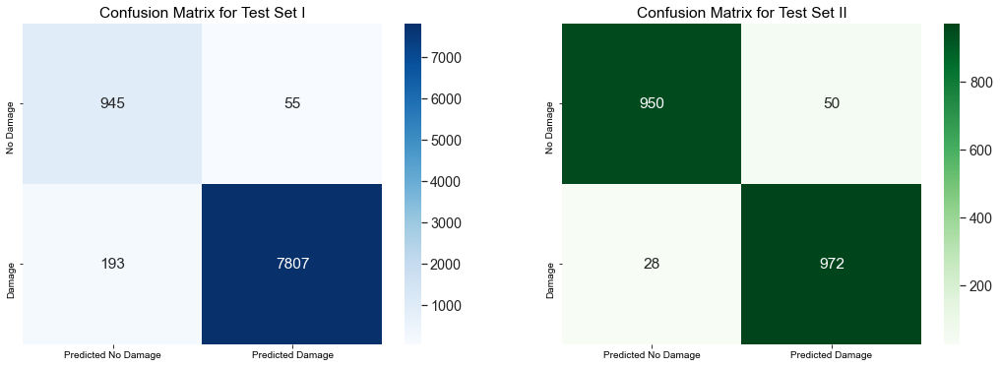

In [ ]:
#Confusion Matrix for Final Tests
# Making a more demonstrative plot for confusion matrix
import pandas as pd
import seaborn as sns
fig, axes = plt.subplots(1,2,figsize=(18,6))



df_cm1 = pd.DataFrame(cm1, index = ['No Damage','Damage'],columns = ['Predicted No Damage','Predicted Damage'])
df_cm2 = pd.DataFrame(cm2, index = ['No Damage','Damage'],columns = ['Predicted No Damage','Predicted Damage'])

sns.set(font_scale=1.3)
sns.heatmap(df_cm1.iloc[-1::-1,:], annot=True,fmt= 'g', ax = axes[0], cmap = 'Blues')
axes[0].set_ylim([0,2]);
axes[0].set_title('Confusion Matrix for Test Set I')

sns.heatmap(df_cm2.iloc[-1::-1,:], annot=True,fmt= 'g', ax = axes[1], cmap = 'Greens')
axes[1].set_ylim([0,2]);
axes[1].set_title('Confusion Matrix for Test Set II');

## **Sensitivity**

The **Sensitivity**, also known as **Recall** or **True Positive Rate(TPR)**


$$TPR = Recall = \frac{TP}{OP} = \frac{TP}{TP+FN},$$

This is also known as **Hit Rate**.
Maximizing the recall towards 1 means keeping down the false negative rate

In [ ]:
Sensitivity_tst1 = TP_tst1/(TP_tst1 + FN_tst1)
Sensitivity_tst2 = TP_tst2/(TP_tst2 + FN_tst2)

print('Sensitivity for Test I:', round(Sensitivity_tst1*100,2),'%')
print('Sensitivity for Test II:', round(Sensitivity_tst2*100,2),'%')


Sensitivity for Test I: 97.59 %
Sensitivity for Test II: 97.2 %


## **Specificity**
The **Specificity** or **True Negative Rate** is defined as

$$TNR = \frac{TN}{ON} = \frac{TN}{FP+TN}$$

This is **1 - False Alarm Rate**.
You want False Alarm Rate to be low. 

In [ ]:
Specificity_tst1 = TN_tst1/(TN_tst1 + FP_tst1)
Specificity_tst2 = TN_tst2/(TN_tst2 + FP_tst2)

print('Specificity for Test I:', round(Specificity_tst1*100,2),'%')
print('Specificity for Test II:', round(Specificity_tst2*100,2),'%')

False_Alarm_tst1 = 1 - Specificity_tst1
False_Alarm_tst2 = 1 - Specificity_tst2

print('\nFalse Alarm Rate for Test I:', round(False_Alarm_tst1*100,2),'%')
print('False Alarm Rate for Test II:', round(False_Alarm_tst2*100,2),'%')


Specificity for Test I: 94.5 %
Specificity for Test II: 95.0 %

False Alarm Rate for Test I: 5.5 %
False Alarm Rate for Test II: 5.0 %


## **Precision** (Positive Predicted Value)

**Precision**,tells you how many of the predicted positive hits were truly positive

$$Precision = \frac{TP}{PP} = \frac{TP}{TP+FP}.$$

In [ ]:
Precision_tst1 = TP_tst1/(TP_tst1 + FP_tst1)
Precision_tst2 = TP_tst2/(TP_tst2 + FP_tst2)

print('Precision for Test I:', round(Precision_tst1*100,2),'%')
print('Precision for Test II:', round(Precision_tst2*100,2),'%')


Precision for Test I: 99.3 %
Precision for Test II: 95.11 %


## **F1 score**
**F1** score gives us the Harmonic Mean of Precision and Recall.
It tries to minimize both **false positives** and **false negatives** simultaneously

$$F1 =  \frac{2*Recall*Precision}{Recall + Precision}$$

In [ ]:
F1_tst1 = (2*Sensitivity_tst1*Precision_tst1)/(Sensitivity_tst1 + Precision_tst1)
F1_tst2 = (2*Sensitivity_tst2*Precision_tst2)/(Sensitivity_tst2 + Precision_tst2)

print('F1 Score for Test I:', round(F1_tst1*100,2),'%')
print('F1 Score for Test II:', round(F1_tst2*100,2),'%')


F1 Score for Test I: 98.44 %
F1 Score for Test II: 96.14 %


### Inferences from the Performance Metrics

1. We see that the Model has a good recall on both Test Set I & II. Recall for I is slightly higher, but that makes sense as there were more Positive Samples

2. We see that both models have a low False Alarm rate. The FAR of Test Set II is slightly lower, but that is again due to lesser number of samples

3. We see that the Model has an extremely high Precision on Test Set I vs Test Set II. This shows that the model was able to get the damaged buildings correctly, but since more damaged buildings were there, it had the opportunity to do so. On an unbiased Set, we see that the Precision is also high (95), but not 99 as Damaged Classes are not more in number

4. Finally, both Models give a good F1 Score, proving that the Model is robust

## ROC Curve

In [ ]:
#ROC Curves
# Area under the roc curve
from sklearn.metrics import roc_auc_score, roc_curve

preds_tst1 = Final_Encoder.predict(tst_gen)
preds_tst2 = Final_Encoder.predict(tst2_gen)

#preds_tst1 = np.argmax(preds_tst1, axis = 1)
#preds_tst2 = np.argmax(preds_tst2, axis = 1)


In [ ]:
auc_1 = [i[1] for i in preds_tst1]
#auc_1.extend([i[1] for i in preds_tst1[8000:]])

In [ ]:
auc_2 = [i[1] for i in preds_tst2]
#auc_2.extend([i[1] for i in preds_tst2[1000:]])

In [ ]:
actual_tst1 = [0 for i in range(8000)]
actual_tst1.extend([1 for i in range(1000)])


In [ ]:
actual_tst2 = [0 for i in range(1000)]
actual_tst2.extend([1 for i in range(1000)])

In [ ]:
#logreg_roc_auc = roc_auc_score(y_test,logreg.predict(X_test))
tst1_auc = roc_auc_score(actual_tst1,tst1_preds)
#knn_roc_auc = roc_auc_score(y_test,knnreg.predict(X_test))
tst2_auc = roc_auc_score(actual_tst2,tst2_preds)

In [ ]:

def plot_roc(actual_tst1,actual_tst2,auc_1,auc_2,axis):
    fpr, tpr, thresholds = roc_curve(actual_tst1, auc_1)
    kfpr, ktpr, kthresholds = roc_curve(actual_tst2, auc_2)
    ax.plot(fpr, tpr, label=f'Test Set I (area = {tst1_auc:.3f})', color = 'b')
    ax.plot(kfpr, ktpr, label=f'Test Set II (area = {tst2_auc:.3f})', color = 'g')  
    label_kwargs = {}
    label_kwargs['bbox'] = dict(
        boxstyle='round,pad=0.3', alpha=0.4,
    )
    #
    for k in range(0, fpr.shape[0], 40):
        #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
        threshold = str(np.round(thresholds[k], 2))
        ax.annotate(threshold, (fpr[k], tpr[k]), **label_kwargs)
    for k in range(0, kfpr.shape[0], 40):
        #from https://gist.github.com/podshumok/c1d1c9394335d86255b8
        threshold = str(np.round(kthresholds[k], 2))
        ax.annotate(threshold, (kfpr[k], ktpr[k]),color='r', **label_kwargs)

    ax.plot([0, 1], [0, 1],'r--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])

    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Receiver operating characteristic')
    ax.legend(loc="lower right")


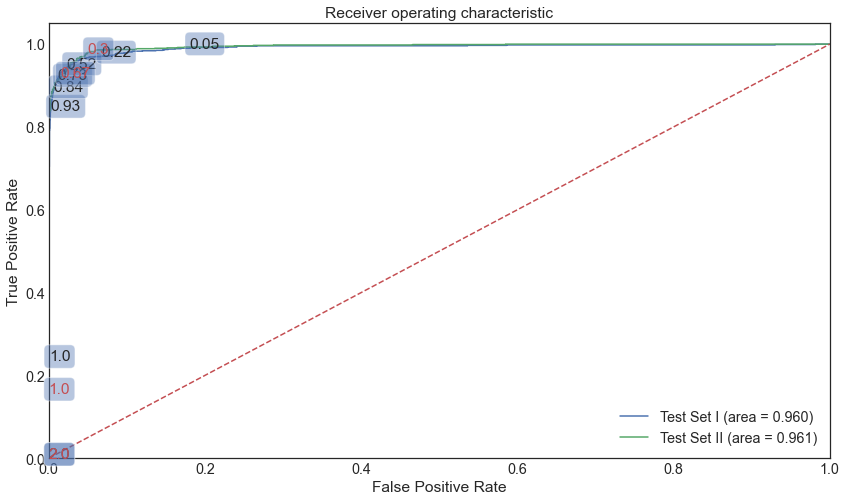

In [ ]:
#ROC Curve values
plt.style.use('seaborn-white')
fig, ax = plt.subplots(figsize = (14,8))
plot_roc(actual_tst1,actual_tst2,auc_1,auc_2,ax)

### **The ROC Curve shows that the Model is extremely robust & good, with a high TPR & low FPR. The Area under Curve is similar & high for both the Test Sets. Thus we can conclude that this model is a good one !**

## Saliency Map & Smooth Grad

In [ ]:
#Saliency, Grad Cam & Fast Cam
# model modifier and loss output 
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils import normalize

def model_modifier(m):
  m.layers[-1].activation = tf.keras.activations.linear
  return m
def dam_loss(output): 
  return (output[0][0]) #Seeing how model is seeing it as a damaged image
def undam_loss(output):
    return (output[0][1]) #Seeing how model is seeing it as an undamaged image

In [ ]:
#function to prepare image before ploting maps 
def prepare_image(image):
  # height, width, channels
  img_array = tf.keras.preprocessing.image.img_to_array(image)                                  
  # (batch_size, height, width, channels), add a dimension because Keras works with batches of images
  img_array_expanded_dims = np.expand_dims(img_array, axis=0)           
  # the preprocess function adequates your image to the format that the model requires
  return img_array_expanded_dims  

In [ ]:
from PIL import Image
dm_image = Image.open('Data\\Saliency\\Damaged\\dam1.jpeg')
dm_image = prepare_image(dm_image)
dm_image = dm_image/255.

dm_image2 = Image.open('Data\\Saliency\\Damaged\\dam2.jpeg')
dm_image2 = prepare_image(dm_image2)
dm_image2 = dm_image2/255.

dm_image3 = Image.open('Data\\Saliency\\Damaged\\dam3.jpeg')
dm_image3 = prepare_image(dm_image3)
dm_image3 = dm_image3/255.




In [ ]:

saliency =Saliency(Final_Encoder, 
                   model_modifier = model_modifier, 
                   clone =False)


In [ ]:
saliency_map = saliency(dam_loss, dm_image)
saliency_map = normalize(saliency_map)

saliency_map2 = saliency(dam_loss, dm_image2)
saliency_map2 = normalize(saliency_map2)

saliency_map3 = saliency(dam_loss, dm_image3)
saliency_map3 = normalize(saliency_map3)

In [ ]:
#smoothgrad 
smooth_grad = saliency(dam_loss, dm_image, smooth_samples=20, smooth_noise=0.20)
smooth_grad = normalize(smooth_grad)

smooth_grad2 = saliency(dam_loss, dm_image2, smooth_samples=20, smooth_noise=0.20)
smooth_grad2 = normalize(smooth_grad2)

smooth_grad3 = saliency(dam_loss, dm_image3, smooth_samples=20, smooth_noise=0.20)
smooth_grad3 = normalize(smooth_grad3)

#plt.imshow(smooth_grad[0], cmap='Greys')

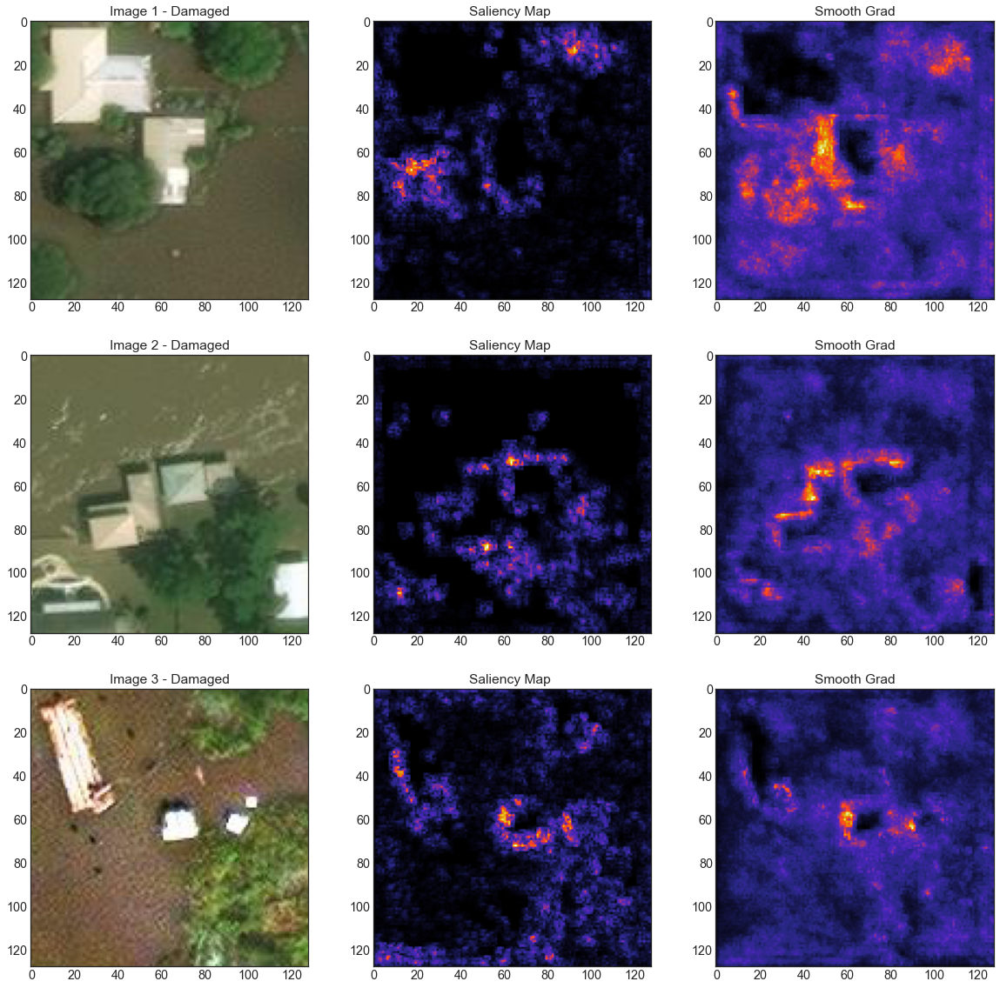

In [ ]:
fig, ax = plt.subplots(3,3, figsize = (20,20))

ax[0][0].imshow(np.squeeze(dm_image))
ax[0][0].set_title('Image 1 - Damaged')

ax[0][1].imshow(saliency_map[0],cmap='CMRmap')
ax[0][1].set_title('Saliency Map ')

ax[0][2].imshow(smooth_grad[0], cmap='CMRmap')
ax[0][2].set_title('Smooth Grad')

ax[1][0].imshow(np.squeeze(dm_image2))
ax[1][0].set_title('Image 2 - Damaged')

ax[1][1].imshow(saliency_map2[0],cmap='CMRmap')
ax[1][1].set_title('Saliency Map ')

ax[1][2].imshow(smooth_grad2[0], cmap='CMRmap')
ax[1][2].set_title('Smooth Grad')


ax[2][0].imshow(np.squeeze(dm_image3))
ax[2][0].set_title('Image 3 - Damaged')

ax[2][1].imshow(saliency_map3[0],cmap='CMRmap')
ax[2][1].set_title('Saliency Map ')

ax[2][2].imshow(smooth_grad3[0], cmap='CMRmap')
ax[2][2].set_title('Smooth Grad')





plt.show()

### Damaged Class Saliency Map

**We had taken 3 images choosen in a way, which represented 3 different types of Images encountered as damaged in the Train & Test Sets.**

Saliency Maps of these 3 images tell how the Model is looking at them, and the loss we have chosen is with respect to the damaged class, so we can see how the gradients from damaged are being affected by the image features 

In [ ]:
from PIL import Image
udm_image = Image.open('Data\\Saliency\\UnDamaged\\undam1.jpeg')
udm_image = prepare_image(udm_image)
udm_image = udm_image/255.

udm_image2 = Image.open('Data\\Saliency\\UnDamaged\\undam2.jpeg')
udm_image2 = prepare_image(udm_image2)
udm_image2 = udm_image2/255.

udm_image3 = Image.open('Data\\Saliency\\UnDamaged\\undam3.jpeg')
udm_image3 = prepare_image(udm_image3)
udm_image3 = udm_image3/255.




In [ ]:

saliency =Saliency(Final_Encoder, 
                   model_modifier = model_modifier, 
                   clone =False)


In [ ]:
usaliency_map = saliency(undam_loss, udm_image)
usaliency_map = normalize(usaliency_map)

usaliency_map2 = saliency(undam_loss, udm_image2)
usaliency_map2 = normalize(usaliency_map2)

usaliency_map3 = saliency(undam_loss, udm_image3)
usaliency_map3 = normalize(usaliency_map3)

In [ ]:
#smoothgrad 
usmooth_grad = saliency(undam_loss, udm_image, smooth_samples=20, smooth_noise=0.20)
usmooth_grad = normalize(usmooth_grad)

usmooth_grad2 = saliency(undam_loss, udm_image2, smooth_samples=20, smooth_noise=0.20)
usmooth_grad2 = normalize(usmooth_grad2)

usmooth_grad3 = saliency(undam_loss, udm_image3, smooth_samples=20, smooth_noise=0.20)
usmooth_grad3 = normalize(usmooth_grad3)

#plt.imshow(smooth_grad[0], cmap='Greys')

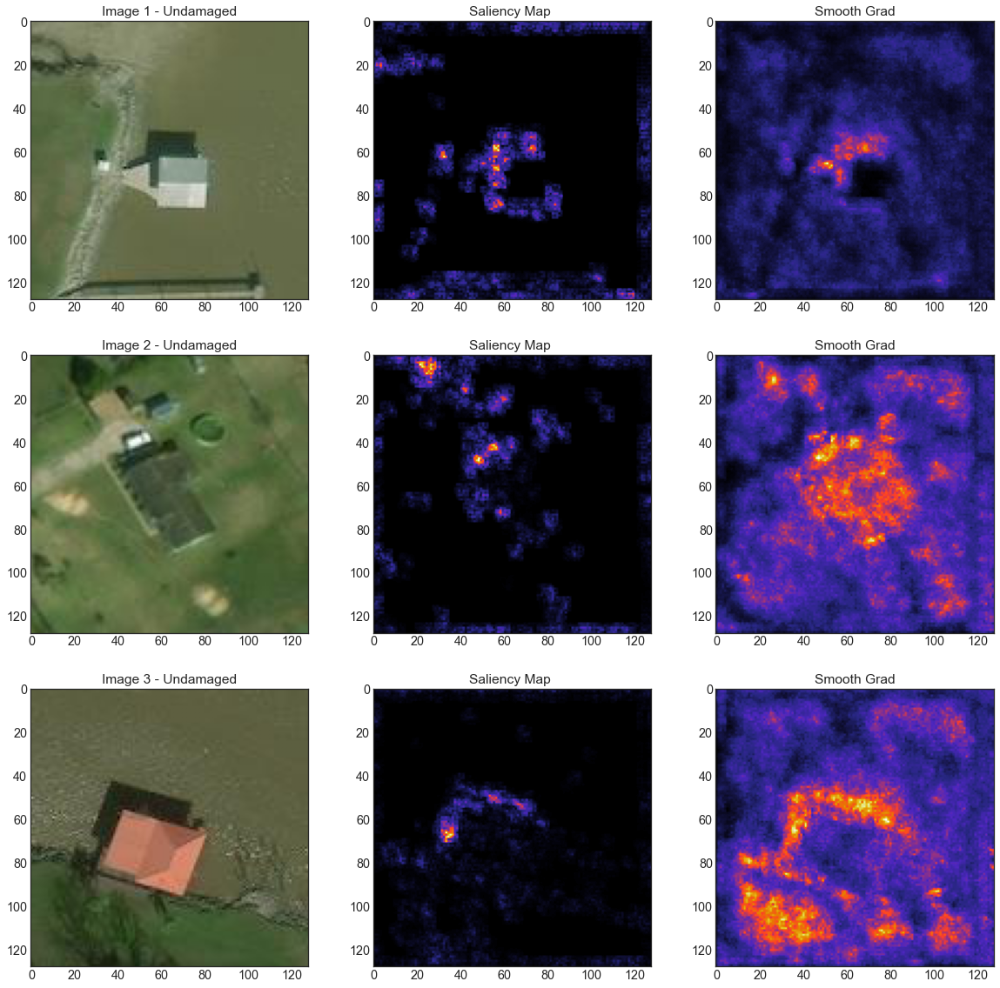

In [ ]:
fig, ax = plt.subplots(3,3, figsize = (20,20))

ax[0][0].imshow(np.squeeze(udm_image))
ax[0][0].set_title('Image 1 - Undamaged')

ax[0][1].imshow(usaliency_map[0],cmap='CMRmap')
ax[0][1].set_title('Saliency Map ')

ax[0][2].imshow(usmooth_grad[0], cmap='CMRmap')
ax[0][2].set_title('Smooth Grad')

ax[1][0].imshow(np.squeeze(udm_image2))
ax[1][0].set_title('Image 2 - Undamaged')

ax[1][1].imshow(usaliency_map2[0],cmap='CMRmap')
ax[1][1].set_title('Saliency Map ')

ax[1][2].imshow(usmooth_grad2[0], cmap='CMRmap')
ax[1][2].set_title('Smooth Grad')


ax[2][0].imshow(np.squeeze(udm_image3))
ax[2][0].set_title('Image 3 - Undamaged')

ax[2][1].imshow(usaliency_map3[0],cmap='CMRmap')
ax[2][1].set_title('Saliency Map ')

ax[2][2].imshow(usmooth_grad3[0], cmap='CMRmap')
ax[2][2].set_title('Smooth Grad')





plt.show()

### Undamaged Class Saliency Map

**We had taken 3 images choosen in a way, which represented 3 different types of Images encountered as undamaged in the Train & Test Sets.**

Saliency Maps of these 3 images tell how the Model is looking at them, and the loss we have chosen is with respect to the undamaged class, so we can see how the gradients from undamaged are being affected by the image features 

# Testing Model on Post - Hurricane Delta Images via Satellite Imagery

**This Data had to be extracted with help of Gdal Library in Python**

1. Post hurricane event image was taken from hurricane delta set which was a large image of pixel size 45546 x 

2. The Image was saved as a tif file and the dataset was a raster image with muntiple bands 

3. Each band contains different information and can vary from temperature, elevation etc. The three bands in our image were RGB Bands. 

4. an image of 12800 x 12800 was taken from the larger .tif file 

5. The image was further processed in chunks of 128x128 

6. 10000 images were obtained by this process 

7. The dataset was cleaned for all water bodies and green area to leave the building portion only 

8. All models, InceptionV3, Resnet 50, VGG and Custom model were used to test classification of this unlabelled images.


# Code to Extract Images from Geo-Spatitial Images of Hurricane Delta, with Gdal Library 


from osgeo import gdal

import os

import matplotlib.pyplot as plt

import numpy as np

from osgeo import osr

import math

#os.chdir('/content/drive/MyDrive/Post-hurricane')

!gdalinfo -nomd post_image.tif

<img src = 'gdal_1.jpg'>

ds = gdal.Open('post_image.tif')

print(ds)

>> <osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x7f948c532300> >

print('File List :' ,ds.GetFileList())

>> File List : ['post_image.tif']
    
print('Width:', ds.RasterXSize)

>> Width: 45546
    
print('Height:', ds.RasterYSize)

>> Height: 211292
    
print('Cordinate System:', ds.GetProjection())

>> Cordinate System: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433],AUTHORITY["EPSG","4326"]]

gt = ds.GetGeoTransform()

print('Origin:', (round(gt[0],3), round(gt[3],3)))

print( 'Pixel size:', (gt[1], gt[5]))

Origin: (-93.508, 31.057)

Pixel size: (6.4281944539423045e-06, -6.4281944539423045e-06)
    
>> Origin x Coordinate

>> Pixel Width

>> x pixel rotation (0 degrees if image is north up

>> y pixel rotation (0 degrees if image is north up)

>> Pixel Height (negetive)

print('Centre:', gdal.ApplyGeoTransform(gt, ds.RasterXSize/2, ds.RasterYSize/2) )

>> Centre: [-93.36183410392846, 30.377781455569167]
    
print('Metadata:', ds.GetMetadata())

>> Metadata: {'AREA_OR_POINT': 'Area', 'OVR_RESAMPLING_ALG': 'BILINEAR'}

print('Image Structure Metadata:', ds.GetMetadata('IMAGE_STRUCTURE'))

>> Image Structure Metadata: {'COMPRESSION': 'YCbCr JPEG', 'INTERLEAVE': 'PIXEL', 'SOURCE_COLOR_SPACE': 'YCbCr'}
    
print("Number of bands:", ds.RasterCount)

>> Number of bands: 3

band=ds.GetRasterBand(1)

data = band.ReadAsArray(xoff=22240, yoff=140350, win_xsize=128, win_ysize=128)

plt.imshow(data)

<img src = 'gdal_2.png'>

block_size_x, block_size_y = band.GetBlockSize()

rgb = np.stack((ds.GetRasterBand(b).ReadAsArray(xoff=22240, yoff=140350, win_xsize=128, win_ysize=128) for b in (3,2,1)))

plt.imshow(rgb)

<img src = 'gdal_3.png'>

rgb_n = np.stack((ds.GetRasterBand(b).ReadAsArray(xoff=10000, yoff=110350, win_xsize=12800, win_ysize=12800) for b in (3,2,1)))

plt.imshow(rgb_n.T)
plt.savefig('rgb_n.jpg')


In [ ]:
'''

counter = 1 
i = 0
j = 0
for i in range(0,12800,128):
    y_min = i
    y_max = i+128
    for j in range(0,12800, 128):
        x_min = j
        x_max = j + 128
        img1 = img[x_min:x_max, y_min:y_max]
        script = 'image'+str(counter)+'.jpg'
        cv2.imwrite(script, img1)
        counter += 1
      
        
 '''   

In [ ]:
hur_dir = 'Data'

hur_datagen = ImageDataGenerator(rescale = 1./255)
hur_gen = hur_datagen.flow_from_directory(hur_dir,classes = ['Hurricane_Web'], target_size = (128,128), color_mode = 'rgb', shuffle = False)


Found 1303 images belonging to 1 classes.


In [ ]:
hur_preds = Final_Encoder.predict(hur_gen)

In [ ]:
hur_preds_class = np.argmax(hur_preds, axis = 1)

In [ ]:
Dam_pred = sum(hur_preds_class==0)
UnDam_pred = sum(hur_preds_class==1)

In [ ]:
print('Total Number of Images with Buildings Post Hurricane:', hur_gen.n)
print('Total Number of Buildings classified as Damaged Post Hurricane:', Dam_pred)
print('Total Number of Buildings classified as Not Damaged Post Hurricane:', UnDam_pred)


Total Number of Images with Buildings Post Hurricane: 1303
Total Number of Buildings classified as Damaged Post Hurricane: 1060
Total Number of Buildings classified as Not Damaged Post Hurricane: 243


In [ ]:
imgs = hur_gen.next()

In [ ]:
non_dam = imgs[0][0]
dam = imgs[0][1]
non_dam2 = imgs[0][2]
dam2 = imgs[0][3]

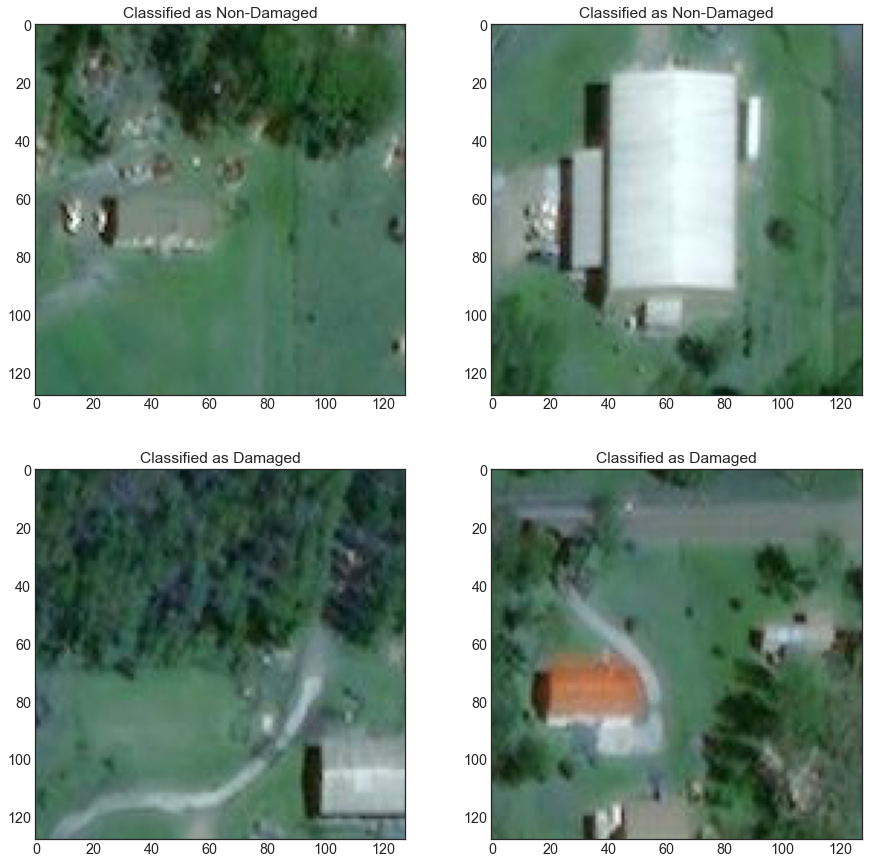

In [ ]:
fig, ax = plt.subplots(2,2, figsize = (15,15))

ax[0][0].imshow(non_dam)
ax[0][0].set_title('Classified as Non-Damaged')


ax[0][1].imshow(non_dam2)
ax[0][1].set_title('Classified as Non-Damaged')

ax[1][0].imshow(dam)
ax[1][0].set_title('Classified as Damaged')

ax[1][1].imshow(dam2)
ax[1][1].set_title('Classified as Damaged')

plt.show()

### Inference from Testing on data from Post - Hurricane Delta

1. Seen manually, with human eyes, it doesn't seem that any of the buildings are damaged
2. We can mostly see Green-Cover, which makes it difficult to tell if building is damaged or not manually
3. However, we see that the Model is predicting 1060 buildings out of 1303 buildings as Damaged

A. This is important as **despite so much Green Cover being there in the pictures, the model is still able to identify the damaged buildings, which wasn't prevelant in the training data. In the training data lot of damaged buildings were surrounded by water, unlike here.**

B. **Since these are images just post a hurricane, it is safe to assume that the majority of the buildings would be damaged in some way. As read about Delta, it was told to be a ferocious Hurricane, with storm surges as high as 11 feet.** More damaged buildings are expected to be present, which the model validates

C. Even if the model could be presumed to have a higher bias towards damaged buildings, we saw that while testing on the provided dataset, **it had given accuracies as high as 97.3 % Even the F1 Scores had been between 97-99%** This is sufficient proof to assume that the model would be generalising well for both Damaged & Un-Damaged buildings, and the prediction given by it can be assumed accurate

## CONCLUSION

<img src='Conclusion.jpeg'>

We feel that the SOTAs might be overfitting, as the architecture is powerful enough to memorise even the noise on the image. 

## **We conclude that our custom Model is the best one for this Satellite Post-Hurricane Images application, as it is giving good results in an optimal amount of time, with least resources**